<a href="https://colab.research.google.com/github/Gakl426/final/blob/main/Meyer_Final_Capstone.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a id='intro'></a>
# Netflix DataFile Analysis


## Research Questions
What can we determine from a netflix dataset and how can we use it to improve viewership


<a id='imports'></a>

# Imports

In [5]:
! nvidia-smi


Wed Apr 10 19:35:05 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla V100-SXM2-16GB           Off | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0              25W / 300W |      0MiB / 16384MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [6]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


**Importing Libraries Needed**

In [88]:
!pip install pydataset

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 55.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pydataset: filename=pydataset-0.2.0-py3-none-any.whl size=15939417 sha256=15b9c60c73f02b17f01669c062ca782ec9574c5d18d162dbf7b41819fd5a7206
  Stored in directory: /root/.cache/pip/wheels/2b/83/5c/073c3755e8b7704e4677557b2055e61026c1a2342149214c13
Successfully built pydataset


In [85]:
pip install plotlyPowerpoint

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 136.8/136.8 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.9/159.9 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.3/9.3 MB 15.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.7 MB/s eta 0:00:00
  Created wheel for python-pptx: filename=python_pptx-0.6.19-py3-none-any.whl size=469934 sha256=62bf951ac1dde837b5a85b1926ba2f738115948c5481561a57dfd6e7112a8d58
  Stored in directory: /root/.cache/pip/wheels/27/10/f3/e564620750d9e3472a3627d6d1fdb8e04f9154dd3704d87288
  Created wheel for numerize: filename=numerize-0.12-py3-none-any.whl size=3156 sha256=214f455fd3a76249c637b137ee3a109ffed6b653a1a9346ccdeb4d9f10a91ce1
  Stored in directory: /root/.cache/pip/wheels/87/84/e1/9e30f2e3da6590acb0f1c03a806e2673d2f9e7

In [89]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.cm as cm
from statistics import mean
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn import datasets, metrics
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import fcluster
from pptx import Presentation
from pydataset import data
import plotlyPowerpoint as pp

import ipywidgets as widgets
from IPython.display import display

import warnings
warnings.filterwarnings('ignore')

import timeit

from sklearn import tree
from IPython.display import Image

import pydotplus
import graphviz

from sklearn import ensemble
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

from sklearn import preprocessing
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split, KFold
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer

from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples
import scipy.cluster.hierarchy as sch
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics.pairwise import euclidean_distances

import nltk
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfTransformer

from scipy.cluster.hierarchy import linkage, dendrogram

from sklearn.metrics import confusion_matrix

from sklearn.svm import SVC

from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

from sklearn.preprocessing import LabelEncoder

sns.set(style="white", color_codes=True)

initiated datasets repo at: /root/.pydataset/


In [99]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<a id='data'></a>
# ***Import* and describing data**

In [100]:

raw_data=pd.read_csv('/content/drive/MyDrive/titles.csv' )
raw_data.head()

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,ts300399,Five Came Back: The Reference Films,SHOW,This collection includes 12 World War II-era propaganda films — many of which are grap...,1945,TV-MA,51,['documentation'],['US'],1.0,NaN,NaN,NaN,0.600,NaN
1,tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works as a night-time taxi driver in New York ...,1976,R,114,"['drama', 'crime']",['US'],NaN,tt0075314,8.2,808582.0,40.965,8.179
2,tm154986,Deliverance,MOVIE,"Intent on seeing the Cahulawassee River before it's turned into one huge lake, outdoor...",1972,R,109,"['drama', 'action', 'thriller', 'european']",['US'],NaN,tt0068473,7.7,107673.0,10.010,7.300
3,tm127384,Monty Python and the Holy Grail,MOVIE,"King Arthur, accompanied by his squire, recruits his Knights of the Round Table, inclu...",1975,PG,91,"['fantasy', 'action', 'comedy']",['GB'],NaN,tt0071853,8.2,534486.0,15.461,7.811
4,tm120801,The Dirty Dozen,MOVIE,12 American military prisoners in World War II are ordered to infiltrate a well-guarde...,1967,NaN,150,"['war', 'action']","['GB', 'US']",NaN,tt0061578,7.7,72662.0,20.398,7.600


<a id='data'></a>
# **Shape of dataset**

In [101]:
raw_data.shape

(5850, 15)

<a id='data'></a>
# **Dataset Info**

In [102]:
raw_data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5850 entries, 0 to 5849
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    5850 non-null   object 
 1   title                 5849 non-null   object 
 2   type                  5850 non-null   object 
 3   description           5832 non-null   object 
 4   release_year          5850 non-null   int64  
 5   age_certification     3231 non-null   object 
 6   runtime               5850 non-null   int64  
 7   genres                5850 non-null   object 
 8   production_countries  5850 non-null   object 
 9   seasons               2106 non-null   float64
 10  imdb_id               5447 non-null   object 
 11  imdb_score            5368 non-null   float64
 12  imdb_votes            5352 non-null   float64
 13  tmdb_popularity       5759 non-null   float64
 14  tmdb_score            5539 non-null   float64
dtypes: float64(5), int64(

In [103]:
raw_data.describe().T

,count,mean,std,min,25%,50%,75%,max
release_year,5850.0,2016.417094,6.937726,1945.000000,2016.0000,2018.000,2020.0000,2022.000
runtime,5850.0,76.888889,39.002509,0.000000,44.0000,83.000,104.0000,240.000
seasons,2106.0,2.162868,2.689041,1.000000,1.0000,1.000,2.0000,42.000
imdb_score,5368.0,6.510861,1.163826,1.500000,5.8000,6.600,7.3000,9.600
imdb_votes,5352.0,23439.382474,95820.470909,5.000000,516.7500,2233.500,9494.0000,2294231.000
tmdb_popularity,5759.0,22.637925,81.680263,0.009442,2.7285,6.821,16.5900,2274.044
tmdb_score,5539.0,6.829175,1.170391,0.500000,6.1000,6.900,7.5375,10.000


In [104]:
raw_data.isna().sum()

id                         0
title                      1
type                       0
description               18
release_year               0
age_certification       2619
runtime                    0
genres                     0
production_countries       0
seasons                 3744
imdb_id                  403
imdb_score               482
imdb_votes               498
tmdb_popularity           91
tmdb_score               311
dtype: int64

In [105]:
raw_data.nunique()

id                      5850
title                   5798
type                       2
description             5829
release_year              63
age_certification         11
runtime                  202
genres                  1726
production_countries     452
seasons                   26
imdb_id                 5447
imdb_score                80
imdb_votes              3880
tmdb_popularity         4889
tmdb_score               394
dtype: int64

In [106]:
raw_data.columns

Index(['id', 'title', 'type', 'description', 'release_year', 'age_certification', 'runtime',
       'genres', 'production_countries', 'seasons', 'imdb_id', 'imdb_score', 'imdb_votes',
       'tmdb_popularity', 'tmdb_score'],
      dtype='object')

<a id='data'></a>
# **Defining DataInfoAll**

In [107]:
def DataInfoAll(raw_data):
    print(f"Dataset Shape: {raw_data.shape}")
    print("-"*125)
    summary = pd.DataFrame(raw_data.dtypes,columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing'] = raw_data.isnull().sum().values
    summary['Uniques'] = raw_data.nunique().values
    summary['First Value'] = raw_data.iloc[0].values
    summary['Second Value'] = raw_data.iloc[1].values
    return summary

In [108]:
DataInfoAll(raw_data)

Dataset Shape: (5850, 15)
-----------------------------------------------------------------------------------------------------------------------------


,Name,dtypes,Missing,Uniques,First Value,Second Value
0,id,object,0,5850,ts300399,tm84618
1,title,object,1,5798,Five Came Back: The Reference Films,Taxi Driver
2,type,object,0,2,SHOW,MOVIE
3,description,object,18,5829,This collection includes 12 World War II-era propaganda films — many of which are grap...,A mentally unstable Vietnam War veteran works as a night-time taxi driver in New York ...
4,release_year,int64,0,63,1945,1976
5,age_certification,object,2619,11,TV-MA,R
6,runtime,int64,0,202,51,114
7,genres,object,0,1726,['documentation'],"['drama', 'crime']"
8,production_countries,object,0,452,['US'],['US']
9,seasons,float64,3744,26,1.0,NaN


##**Checking for Duplicates**



In [109]:
df_duplicate=raw_data[raw_data.duplicated()]
print("Here ae the duplicated values: ")
df_duplicate

Here ae the duplicated values: 


,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score


<a id='data'></a>
# **Checking for NAN values**

In [110]:
NaN_Checker = pd.DataFrame({"No Of Total Values": raw_data.shape[0] , "No of NaN values": raw_data.isnull().sum(),
                    "%age of NaN values" : round((raw_data.isnull().sum()/ raw_data.shape[0])*100 , 2) })
NaN_Checker.sort_values("No of NaN values" , ascending = False)

,No Of Total Values,No of NaN values,%age of NaN values
seasons,5850,3744,64.00
age_certification,5850,2619,44.77
imdb_votes,5850,498,8.51
imdb_score,5850,482,8.24
imdb_id,5850,403,6.89
tmdb_score,5850,311,5.32
tmdb_popularity,5850,91,1.56
description,5850,18,0.31
title,5850,1,0.02
id,5850,0,0.00


In [111]:
plot_nan = raw_data.isna()
plot_nan.head(2)

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,False,False,False,False,False,False,False,False,False,False,True,True,True,False,True
1,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False


In [112]:
import plotly.express as px

fig = px.bar(raw_data.isna().sum(), title='Null Counts in raw_data')
fig.show()
fig.write_html("null_counts.html")


In [113]:
numerical_columns = raw_data.select_dtypes(include=['number']).columns

In [114]:
categorical_columns = raw_data.select_dtypes(include=['object']).columns

In [115]:
for column in numerical_columns:
    raw_data[column].fillna(raw_data[column].median(), inplace=True)

In [116]:
for col in categorical_columns:
    raw_data[col].fillna(raw_data[col].mode()[0], inplace=True)

print("Remaining missing values:\n", raw_data.isnull().sum())

Remaining missing values:
 id                      0
title                   0
type                    0
description             0
release_year            0
age_certification       0
runtime                 0
genres                  0
production_countries    0
seasons                 0
imdb_id                 0
imdb_score              0
imdb_votes              0
tmdb_popularity         0
tmdb_score              0
dtype: int64


*italicized text*<a id='data'></a>
# **Looking for Unique values**

In [117]:
raw_data.nunique()

id                      5850
title                   5798
type                       2
description             5829
release_year              63
age_certification         11
runtime                  202
genres                  1726
production_countries     452
seasons                   26
imdb_id                 5447
imdb_score                80
imdb_votes              3881
tmdb_popularity         4889
tmdb_score               394
dtype: int64

<a id='explore'></a>
# **Exploratory Data Analysis**

In [118]:
df=raw_data

 **Determine breakdown by Type**

In [119]:
type_count = df['type'].value_counts()
fig = px.bar(type_count, x=type_count.index, y=type_count.values, title='Breakdown by Type')
fig.write_html("breakdown_by_type.html")
fig.show()


<Axes: xlabel='type', ylabel='count'>

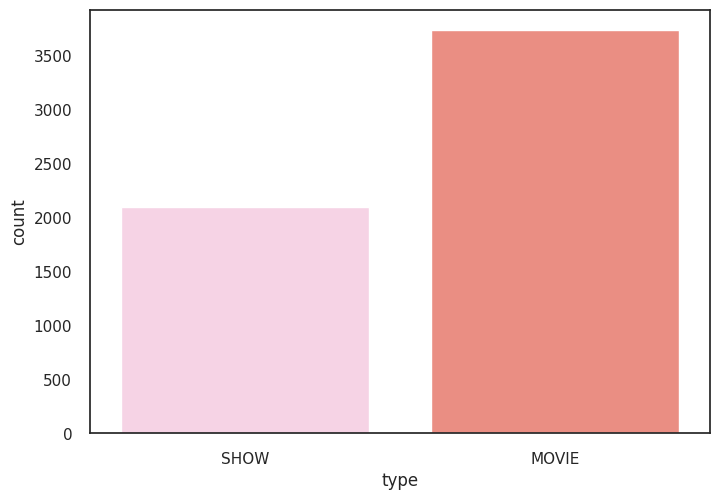

In [ ]:
sns.countplot(x='type', data=df, palette='Set3_r')

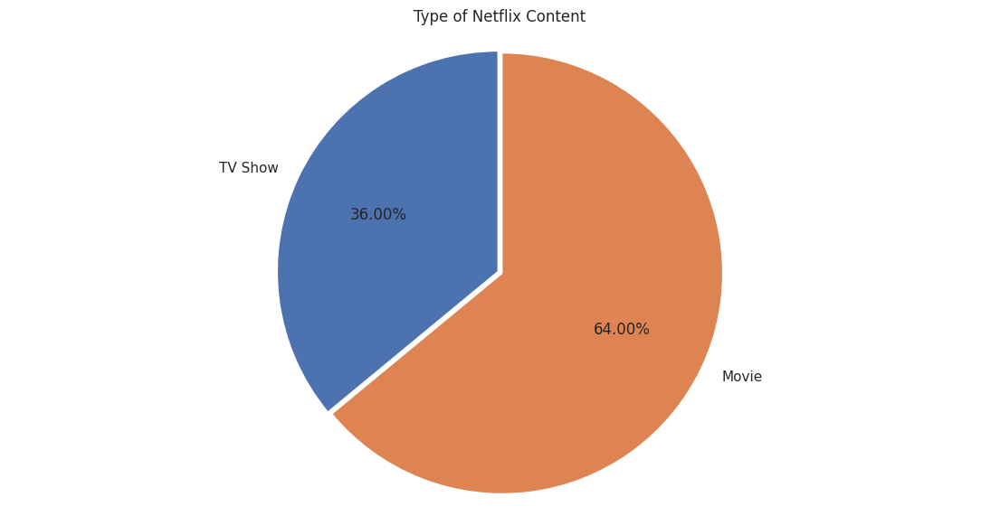

In [ ]:
plt.figure(figsize=(14, 7))
labels=['TV Show', 'Movie']
plt.pie(df['type'].value_counts().sort_values(),labels=labels,explode=[0.01,0.01],
        autopct='%1.2f%%', startangle=90)
plt.title('Type of Netflix Content')
plt.axis('equal')
plt.show()

In [ ]:
df['genres'] = df['genres'].str.replace(r'[','').str.replace(r"'",'').str.replace(r']','')
df['genre'] = df['genres'].str.split(',').str[0]

df['production_countries'] = df['production_countries'].str.replace(r"[", '').str.replace(r"'", '').str.replace(r"]", '')
df['production_country'] = df['production_countries'].str.split(',').str[0]

In [37]:
import plotly.express as px

fig = px.histogram(df, x="age_certification", color="age_certification",
                   title="Age Certification Distribution")
fig.show()


<Axes: xlabel='age_certification', ylabel='count'>

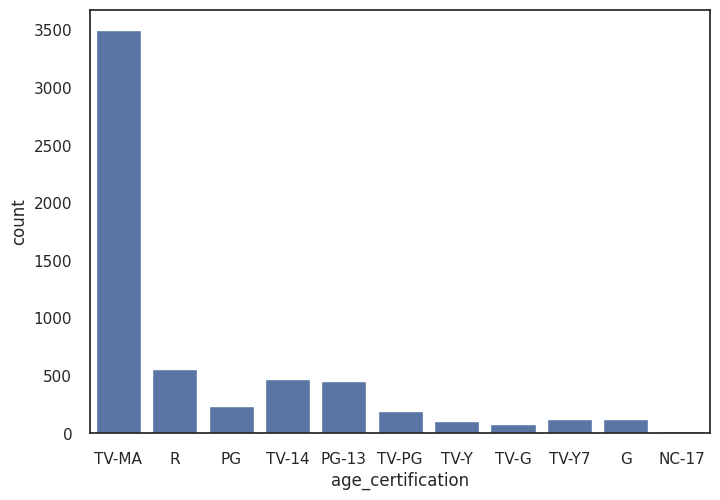

In [ ]:
sns.countplot(x=df['age_certification'])

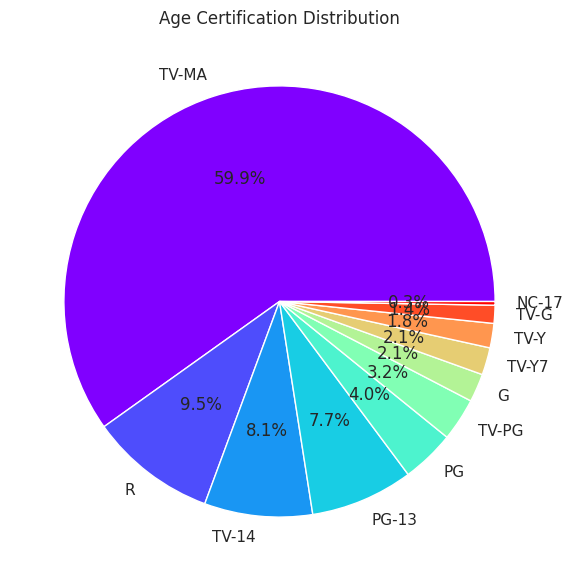

In [ ]:
plt.figure(figsize=(10, 7))
labels = df['age_certification'].value_counts().index
sizes = df['age_certification'].value_counts().values
colors = cm.rainbow(np.linspace(0, 1, len(labels)))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%')
plt.title('Age Certification Distribution')
plt.show()


# **Converting Ratings to Target Audience**

In [46]:
ratings = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'NC-17': 'Adults'
}
df['target_ages'] = df['age_certification'].replace(ratings)

In [49]:
# prompt: plotly histogram target_ages colorful

fig = px.histogram(df, x="target_ages", color="target_ages",
                   title="Target Audience Distribution",
                   color_discrete_sequence=px.colors.qualitative.Alphabet)
fig.show()


<Axes: xlabel='target_ages', ylabel='count'>

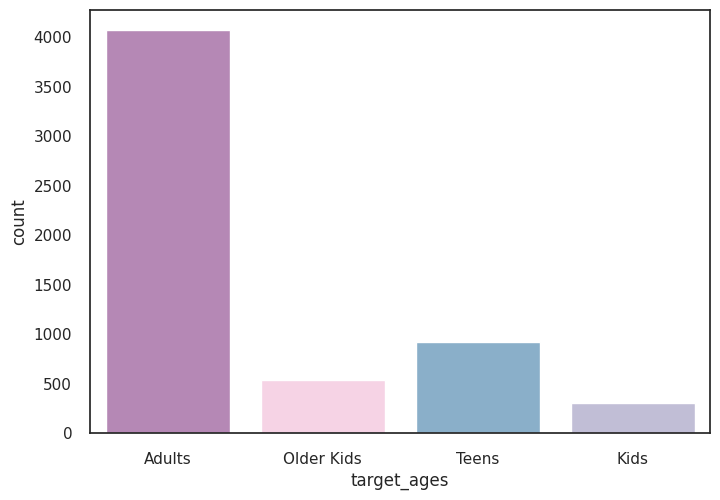

In [50]:
sns.countplot(x=df['target_ages'],palette='Set3_r')

In [51]:
list(df['production_countries'].value_counts().index[:10])

["['US']",
 "['IN']",
 "['JP']",
 '[]',
 "['KR']",
 "['GB']",
 "['ES']",
 "['FR']",
 "['CA']",
 "['MX']"]

# **Heat Map of Production Country and Target Audience**

In [52]:
crosstab = pd.crosstab(df['production_country'], df['target_ages'])

top_countries = crosstab.sum(axis=1).sort_values(ascending=False)[:4].index

top_ages = crosstab.sum(axis=0).sort_values(ascending=False)[:4].index

sns.heatmap(crosstab.loc[top_countries, top_ages], annot=True, fmt='d', cmap='YlGnBu')

plt.xlabel('Target Age')
plt.ylabel('Production Country')
plt.title('Top 5 Production Countries by Target Age')
plt.show()

KeyError: 'production_country'

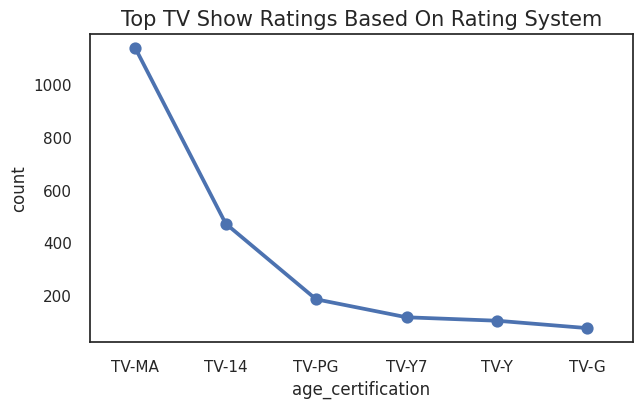

In [53]:
df_tv_show = df[df['type']== 'SHOW' ]
df_tv_show.head(2)
tv_ratings = df_tv_show.groupby(['age_certification'])['id'].count().reset_index(name = 'count').sort_values(by = 'count', ascending = False)
fig_dims = (7,4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.pointplot(x='age_certification',y='count',data=tv_ratings)
plt.title('Top TV Show Ratings Based On Rating System',size='15')
plt.show()

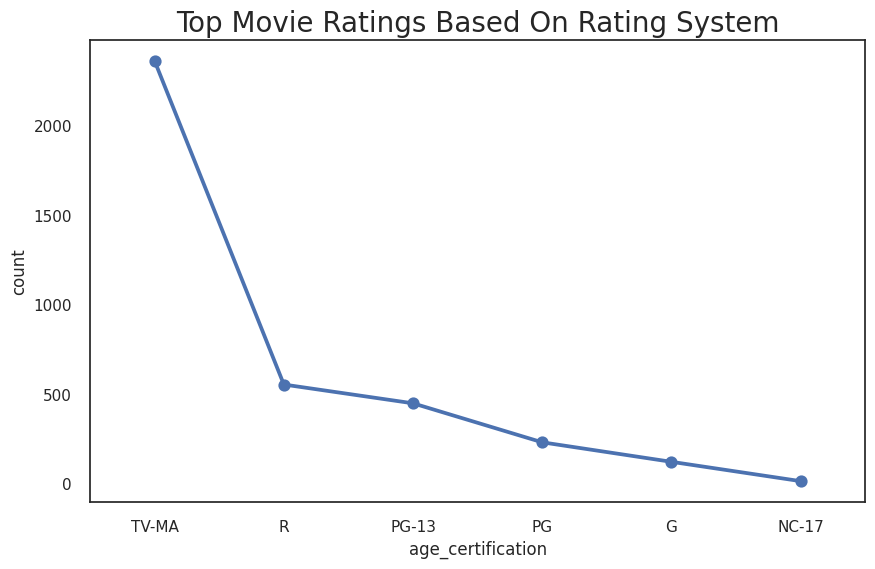

In [ ]:
df_movies = df[df['type'] == 'MOVIE' ]
df_movies.head(2)
tv_ratings = df_movies.groupby(['age_certification'])['id'].count().reset_index(name = 'count').sort_values(by = 'count', ascending = False)
fig_dims = (10,6)
fig, ax = plt.subplots(figsize=fig_dims)
sns.pointplot(x='age_certification',y='count',data=tv_ratings)
plt.title('Top Movie Ratings Based On Rating System',size='20')
plt.show()

# **Scatterplot for Release and IMDb ratings**

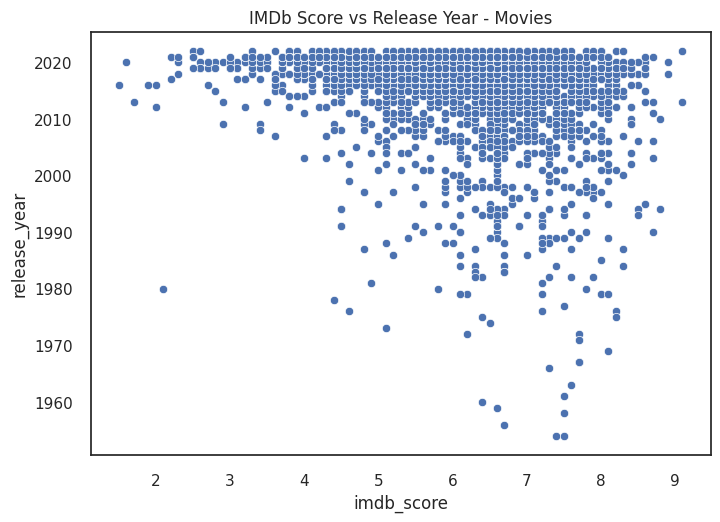

In [ ]:
sns.scatterplot(data=df_movies,x='imdb_score',y='release_year')
plt.title('IMDb Score vs Release Year - Movies')
plt.show()

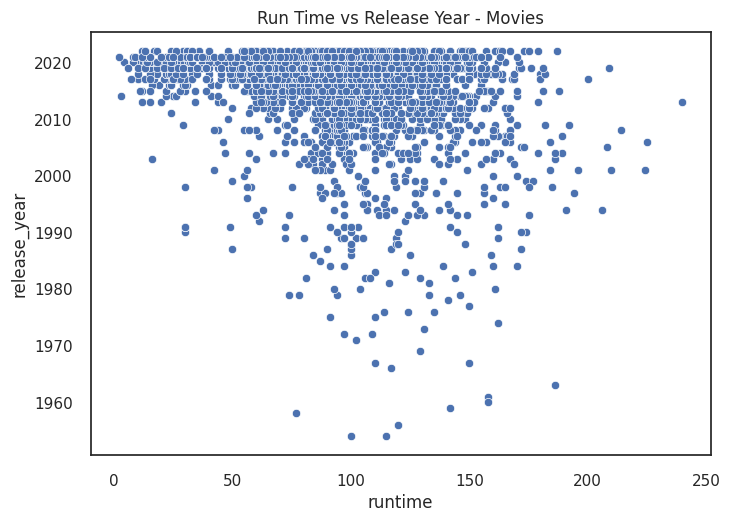

In [ ]:
sns.scatterplot(data=df_movies,x='runtime',y='release_year')
plt.title('Run Time vs Release Year - Movies')
plt.show()

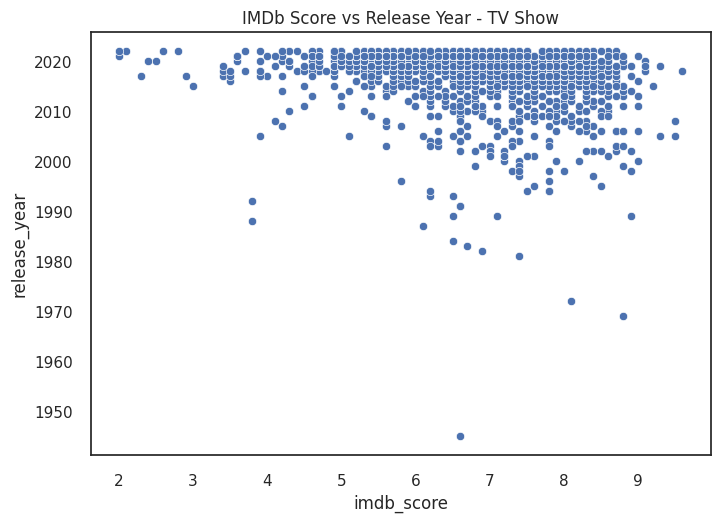

In [ ]:
sns.scatterplot(data=df_tv_show,x='imdb_score',y='release_year')
plt.title('IMDb Score vs Release Year - TV Show')
plt.show()

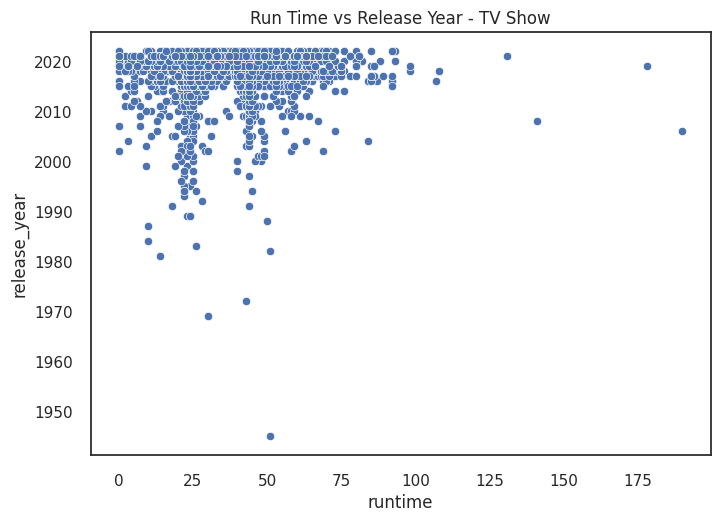

In [ ]:
sns.scatterplot(data=df_tv_show,x='runtime',y='release_year')
plt.title('Run Time vs Release Year - TV Show')
plt.show()

In [ ]:
from pydoc import describe

print("Average IMDb score for movies:", df_movies['imdb_score'].mean())
print("Average IMDb score for TV shows:", df_tv_show['imdb_score'].mean())


Average IMDb score for movies: 6.2764690170940165
Average IMDb score for TV shows: 6.947958214624881


In [ ]:
print("Average Run Time for movies:", df_movies['runtime'].mean())
print("Average Run Time for TV shows:", df_tv_show['runtime'].mean())

Average Run Time for movies: 98.21367521367522
Average Run Time for TV shows: 38.978157644824314


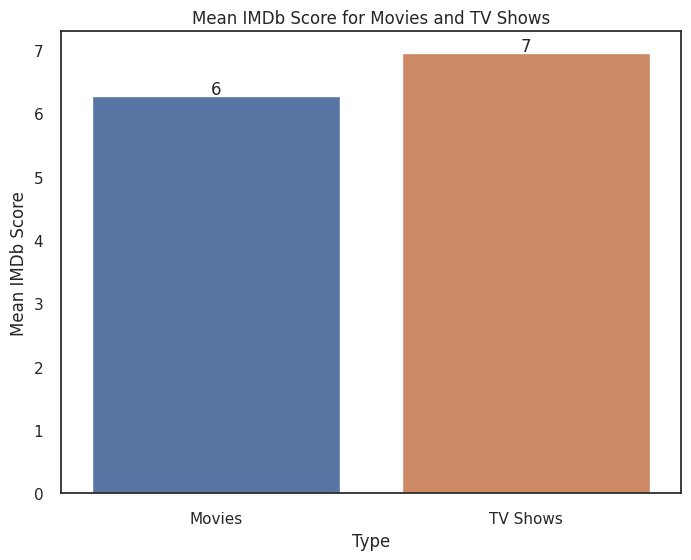

In [ ]:
mean_imdb_score_movies = df_movies['imdb_score'].mean()
mean_imdb_score_tv_shows = df_tv_show['imdb_score'].mean()

plt.figure(figsize=(8, 6))
sns.barplot(x=['Movies', 'TV Shows'], y=[mean_imdb_score_movies, mean_imdb_score_tv_shows], palette='deep')

plt.title('Mean IMDb Score for Movies and TV Shows')
plt.xlabel('Type')
plt.ylabel('Mean IMDb Score')
for p in plt.gca().patches:
    plt.gca().annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.show()


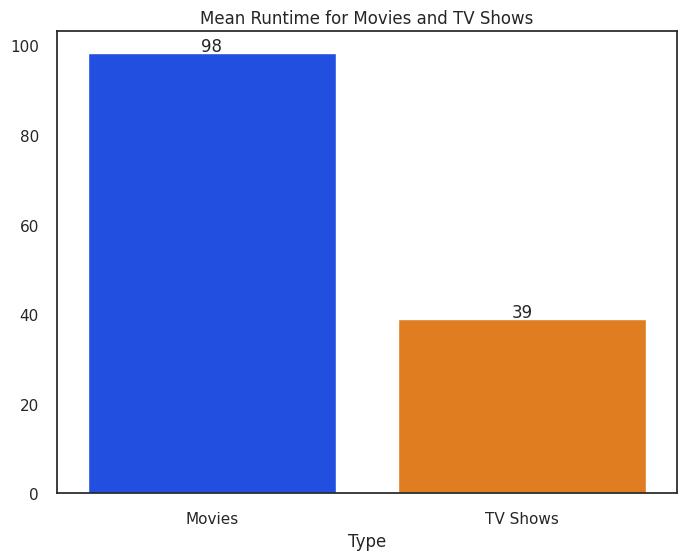

In [ ]:
mean_runtime_movies = df_movies['runtime'].mean()
mean_runtime_tv_shows = df_tv_show['runtime'].mean()

plt.figure(figsize=(8, 6))
sns.barplot(x=['Movies', 'TV Shows'], y=[mean_runtime_movies, mean_runtime_tv_shows], palette='bright')

plt.title('Mean Runtime for Movies and TV Shows')
plt.xlabel('Type')
for p in plt.gca().patches:
    plt.gca().annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.show()

# **Production by content and year**

In [56]:
yearly_movies=df[df.type =='SHOW']['release_year'].value_counts().sort_index(ascending=False).head(15)
yearly_shows=df[df.type =='MOVIE']['release_year'].value_counts().sort_index(ascending=False).head(15)
total_content=df['release_year'].value_counts().sort_index(ascending=False).head(15)

In [57]:
yearly_movies.head()

release_year
2022    171
2021    314
2020    314
2019    311
2018    300
Name: count, dtype: int64

In [69]:
# prompt: plotly trendline for movies total content and tv shows by year with title as Release Growth  show legend

import plotly.express as px

fig = px.line(x=total_content.index, y=total_content.values, labels={'x':'Year', 'y':'Total Content'})
fig.add_trace(px.line(x=yearly_movies.index, y=yearly_movies.values, labels={'x':'Year', 'y':'Movies'}).data[0])
fig.add_trace(px.line(x=yearly_shows.index, y=yearly_shows.values, labels={'x':'Year', 'y':'TV Shows'}).data[0])

fig.update_layout(title='Release Growth', legend_title='Type')
fig.show()


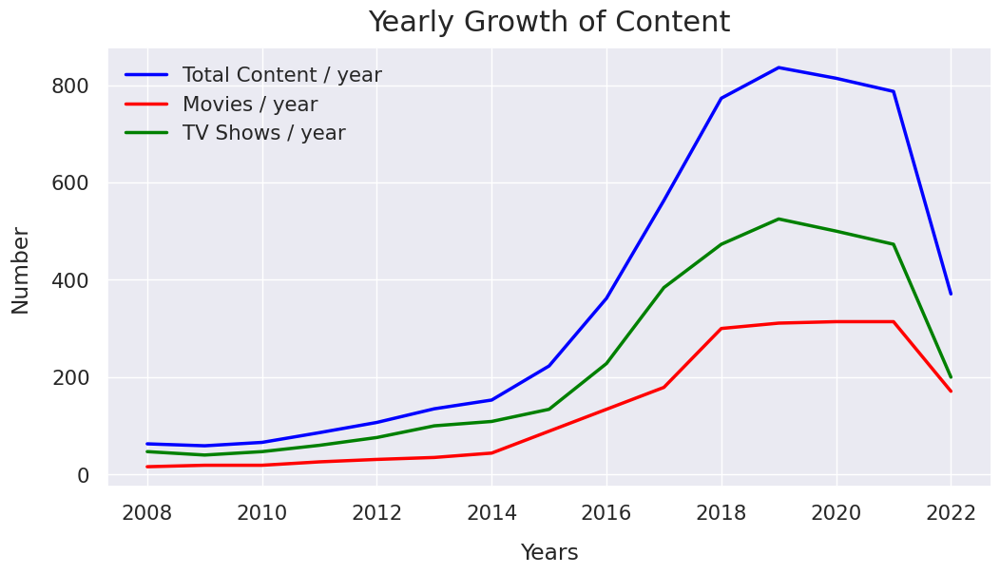

In [ ]:
sns.set(font_scale=1.4)
total_content.plot(figsize=(12, 6), linewidth=2.5, color='blue',label="Total Content / year")
yearly_movies.plot(figsize=(12, 6), linewidth=2.5, color='red',label="Movies / year",ms=3)
yearly_shows.plot(figsize=(12, 6), linewidth=2.5, color='green',label="TV Shows / year")
plt.xlabel("Years", labelpad=15)
plt.ylabel("Number", labelpad=15)
plt.legend()
plt.title("Yearly Growth of Content", y=1.02, fontsize=22);

<Figure size 1400x800 with 0 Axes>

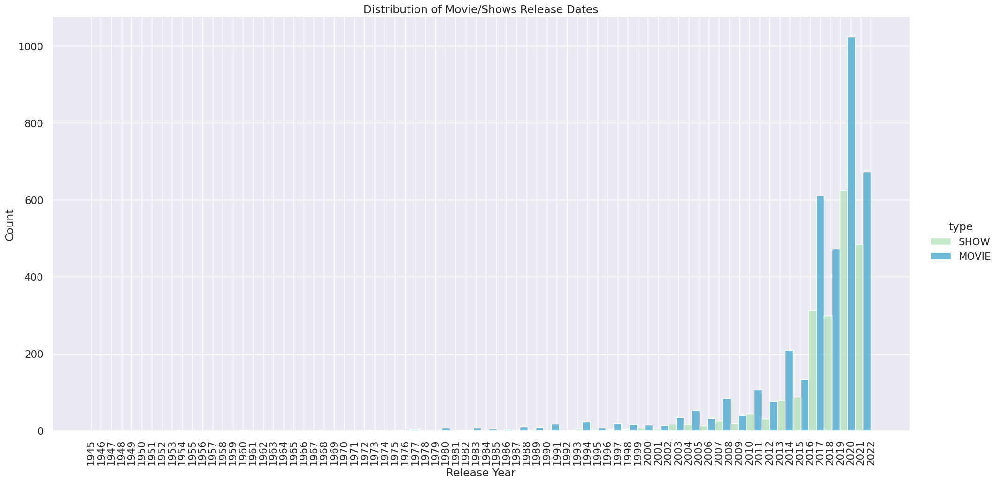

In [ ]:
a = plt.figure(figsize=(14,8))
a = sns.displot(x='release_year', hue = 'type', data = df, kind = 'hist', height=10, aspect=2, bins = 50, multiple='dodge', palette='GnBu')
a = plt.xticks(ticks= np.arange(df.release_year.min(),df.release_year.max()+1,1), rotation = 90)
a = plt.title('Distribution of Movie/Shows Release Dates')
a = plt.xlabel('Release Year')

In [ ]:
df['release_year'].unique()


array([1945, 1976, 1972, 1975, 1967, 1969, 1979, 1971, 1980, 1961, 1966,
       1954, 1958, 1977, 1963, 1956, 1960, 1973, 1974, 1959, 1978, 1989,
       1990, 1987, 1984, 1983, 1982, 1986, 1981, 1988, 1985, 2000, 1996,
       1997, 1995, 1994, 1999, 1998, 1993, 1992, 1991, 2008, 2002, 2010,
       2005, 2007, 2004, 2006, 2009, 2003, 2001, 2011, 2012, 2013, 2014,
       2015, 2016, 2018, 2017, 2019, 2020, 2022, 2021])

In [ ]:
type(df['release_year'][0])

numpy.int64

In [ ]:
df['release_year'].value_counts().to_frame().T

release_year,2019,2020,2021,2018,2017,2022,2016,2015,2014,2013,...,1973,1958,1977,1963,1956,1960,1974,1959,1978,1945
count,836,814,787,773,563,371,362,223,153,135,...,1,1,1,1,1,1,1,1,1,1


# **Using BoxPlot to identify outliers by year**

In [76]:
# prompt: plotly boxplot total release_year

import plotly.express as px

# Create a box plot of the release year
fig = px.box(df, x="release_year", y="type", color="type")

# Show the plot
fig.show()


<Axes: ylabel='release_year'>

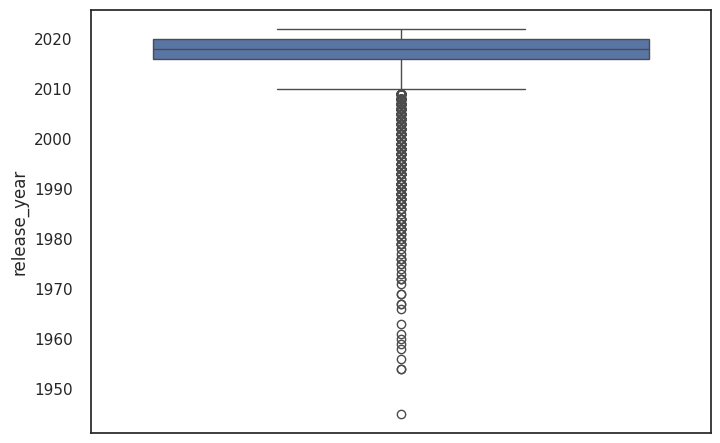

In [77]:
sns.boxplot(df.release_year)

# **Replace outliers with mean value**

In [78]:
release_year_Q1 = df.release_year.quantile(0.25)
release_year_Q3 = df.release_year.quantile(0.75)
release_year_IQR = release_year_Q3 - release_year_Q1
print(f'release_year_Q1 = {release_year_Q1}\nrelease_year_Q3 = {release_year_Q3}\nrelease_year_IQR = {release_year_IQR}')

release_year_Q1 = 2016.0
release_year_Q3 = 2020.0
release_year_IQR = 4.0


In [79]:
release_year_outliers = df[(df.release_year < (release_year_Q1 - 1.5 * release_year_IQR)) |
                           ( df.release_year > (release_year_Q3 + 1.5 * release_year_IQR)) ]

In [80]:
release_year_outliers

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,target_ages
0,ts300399,Five Came Back: The Reference Films,SHOW,This collection includes 12 World War II-era p...,1945,TV-MA,51,['documentation'],['US'],1.0,tt0047500,6.6,2233.5,0.600,6.900,Adults
1,tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works ...,1976,R,114,"['drama', 'crime']",['US'],1.0,tt0075314,8.2,808582.0,40.965,8.179,Adults
2,tm154986,Deliverance,MOVIE,Intent on seeing the Cahulawassee River before...,1972,R,109,"['drama', 'action', 'thriller', 'european']",['US'],1.0,tt0068473,7.7,107673.0,10.010,7.300,Adults
3,tm127384,Monty Python and the Holy Grail,MOVIE,"King Arthur, accompanied by his squire, recrui...",1975,PG,91,"['fantasy', 'action', 'comedy']",['GB'],1.0,tt0071853,8.2,534486.0,15.461,7.811,Older Kids
4,tm120801,The Dirty Dozen,MOVIE,12 American military prisoners in World War II...,1967,TV-MA,150,"['war', 'action']","['GB', 'US']",1.0,tt0061578,7.7,72662.0,20.398,7.600,Adults
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
634,ts82592,The Truth,SHOW,A devious businessman covets his partner's pri...,2008,TV-14,44,"['thriller', 'drama']",['SG'],1.0,tt9233832,6.6,2233.5,0.600,6.900,Teens
636,tm404676,To and from New York,MOVIE,"While covering a story in New York City, a Sea...",2006,TV-MA,82,[],['US'],1.0,tt0047500,6.6,2233.5,1.401,5.800,Adults
637,tm89054,Osuofia in London 2,MOVIE,Osuofia return to his Nigerian village with a ...,2004,TV-MA,72,[],['XX'],1.0,tt0047500,6.6,2233.5,1.091,6.900,Adults
638,tm252951,Brother's Shadow,MOVIE,Jake Groden is the black sheep of his family. ...,2006,TV-MA,91,['drama'],['US'],1.0,tt0468458,6.1,152.0,0.999,7.000,Adults


In [81]:
df["release_year"] = np.where(df["release_year"] <2009, df.release_year.mean(),df['release_year'])

In [82]:
df.release_year.describe()

count    5850.000000
mean     2017.991078
std         2.783304
min      2009.000000
25%      2016.417094
50%      2018.000000
75%      2020.000000
max      2022.000000
Name: release_year, dtype: float64

# **BoxPlot for Release_Year**

In [83]:
# prompt: plotly boxplot total release_year

import plotly.express as px

# Create a box plot of the release year
fig = px.box(df, x="release_year", y="type", color="type")

# Show the plot
fig.show()

<Axes: ylabel='release_year'>

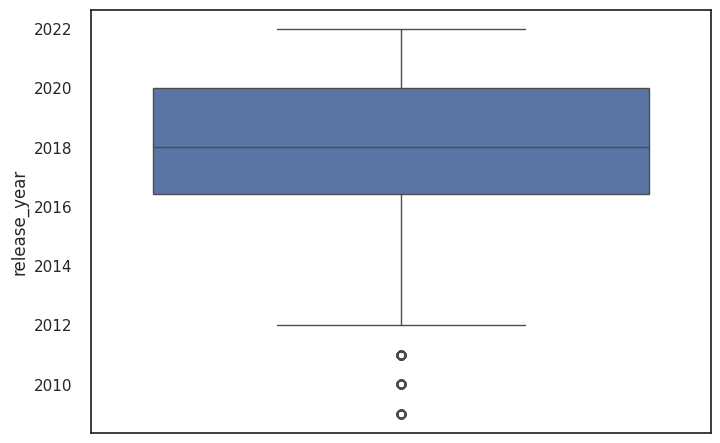

In [84]:
sns.boxplot(df.release_year)

# **Titles**

In [ ]:
df.title.nunique()

5798

In [ ]:
df.shape[0]

5850

# **Production Country Count**

In [ ]:
df.production_countries.value_counts().rename_axis('Countries').reset_index(name='counts').T

,0,1,2,3,4,5,6,7,8,9,...,442,443,444,445,446,447,448,449,450,451
Countries,US,IN,JP,,KR,GB,ES,FR,CA,MX,...,"GE, DE, FR","SG, GB, US","GB, ID, CA, CN, SG, US","IR, US, FR","US, IE, CA","CZ, GB, US","US, AU, GB",HU,"IQ, GB","PH, FO"
counts,1959,599,264,229,222,218,161,125,107,98,...,1,1,1,1,1,1,1,1,1,1


# **Checking for NaN values Country**

In [ ]:
df.production_countries.isna().sum()

0

# **Replace NaN value with mode value**

In [ ]:
df.production_countries.mode()[0]

'US'

In [ ]:
df.production_countries[df.production_countries.isna()] = df.production_countries.mode()[0]

In [ ]:
df.production_countries[df.production_countries.isna()]

Series([], Name: production_countries, dtype: object)

# **Exploring Countries and Number of Netflix Production**

In [ ]:
country_list=[]
tv_show=[]
movies=[]
for i in range(0,len(df)):
  if isinstance(df['production_countries'].iloc[i] , str):
    split=df['production_countries'].iloc[i].split(',')
    for k in split:
      country_list.append(k.strip())
      if df['type'].iloc[i]=='SHOW':
        tv_show.append(k.strip())
      if df['type'].iloc[i]== 'Movie':
        movies.append(k.strip())
production_country=list(set([(i,country_list.count(i),tv_show.count(i),movies.count(i)) for i in country_list]))

In [ ]:
production_country[:5]

[('SY', 3, 1, 0),
 ('MA', 5, 1, 0),
 ('PE', 12, 1, 0),
 ('AU', 84, 43, 0),
 ('IR', 2, 0, 0)]

# **Making a country dataframe**

In [ ]:
# prompt: create country_df from production_country having columns Country, Movies, TV Shows, productions ascending display top 5

country_df = pd.DataFrame(production_country,columns=['Country','Productions','TV Shows','Movies'])
country_df = country_df.sort_values('Productions',ascending=False)
country_df.head()


,Country,Productions,TV Shows,Movies
39,US,2323,824,0
71,IN,622,45,0
81,GB,404,148,0
24,JP,287,169,0
72,FR,248,64,0


In [ ]:
country_df= pd.DataFrame(production_country,columns=['Country','Productions','TV Shows','Movies'], )
country_df=country_df.reset_index()
country_df=country_df.drop('index',axis=1)

In [ ]:
# prompt: create top_countries from country_df and show top 5 based on production

top_countries = country_df.sort_values(by='Productions', ascending=False).head()
top_countries


,Country,Productions,TV Shows,Movies
39,US,2323,824,0
71,IN,622,45,0
81,GB,404,148,0
24,JP,287,169,0
72,FR,248,64,0


In [ ]:
top_countries.T

,39,71,81,24,72
Country,US,IN,GB,JP,FR
Productions,2323,622,404,287,248
TV Shows,824,45,148,169,64
Movies,0,0,0,0,0


# **Distribution of shows by country**

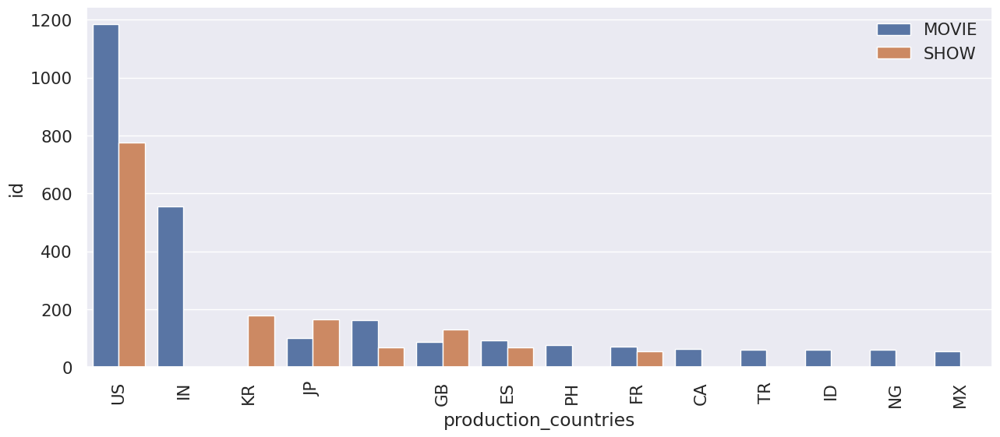

In [ ]:
df_country = df.groupby(['production_countries', 'type'])['id'].count().sort_values(ascending = False).reset_index()
plt.figure(figsize = (15, 6))
sns.barplot(data = df_country, x = df_country['production_countries'][:20], y = df_country['id'], hue = 'type')
plt.xticks(rotation = 90)
plt.legend(loc = 'upper right')
plt.show()

# **Breakdown of type**

# **Duration of Show**

In [ ]:
df.runtime.isna().sum()

0

In [ ]:
df.runtime.nunique()

202

# **Duration value_count**

In [ ]:
df.runtime.value_counts().to_frame().T

runtime,24,90,44,25,95,100,45,23,94,96,...,154,208,210,188,214,225,190,192,240,187
count,127,126,102,98,97,95,94,91,88,80,...,1,1,1,1,1,1,1,1,1,1


# **Standardize seasons into minutes**

In [ ]:
def convert_seasons_to_min(value):

  no_of_avg_episode = 5
  if "Seasons" in value:
    value = value.replace("Seasons",'')
    value = value.replace(" ","")
    total_seasons = int(value)
    each_season_mins = ( no_of_avg_episode * 55 )
    total_mins = (total_seasons * each_season_mins)
    return total_mins

  elif "Season" in value:
    value = value.replace("Season",'')
    value = value.replace(" ","")
    total_mins = (no_of_avg_episode * 55)
    return total_mins

In [ ]:
convert_seasons_to_min("4 Seasons")

1100

In [ ]:
def all_the_duration_in_minutes():
  """
  This function will convert all the duration
  whether it's in minutes or season format to minute
  """
  df['duration'] = df.duration.str.replace(" min" , "")
  time_list =[]
  for time in df.duration.values:
    if "Season" in time:
      time = convert_seasons_to_min(time)
    else:
      time = time.replace(" ","")
    time_list.append(time)

  time_list = [ int(Time) for Time in time_list]

  df.duration = time_list

In [ ]:
df.runtime.value_counts().to_frame().T

runtime,24,90,44,25,95,100,45,23,94,96,...,154,208,210,188,214,225,190,192,240,187
count,127,126,102,98,97,95,94,91,88,80,...,1,1,1,1,1,1,1,1,1,1


In [ ]:
df.runtime.value_counts().to_frame().T

runtime,24,90,44,25,95,100,45,23,94,96,...,154,208,210,188,214,225,190,192,240,187
count,127,126,102,98,97,95,94,91,88,80,...,1,1,1,1,1,1,1,1,1,1


# **Duration of movies**

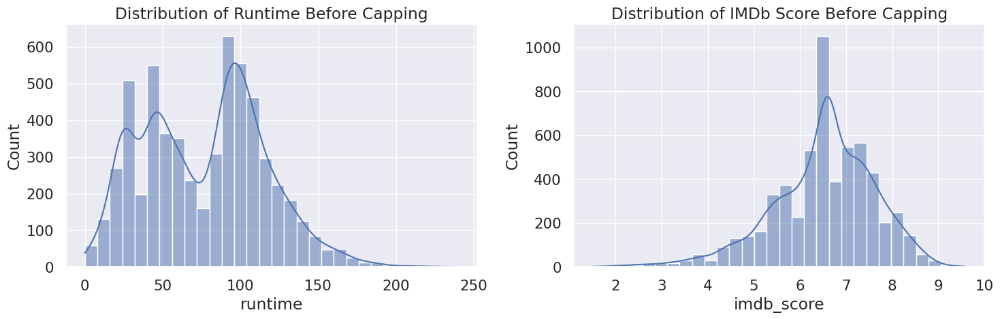

In [ ]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.histplot(data=df, x='runtime', bins=30, kde=True)
plt.title('Distribution of Runtime Before Capping')

plt.subplot(1, 2, 2)
sns.histplot(data=df, x='imdb_score', bins=30, kde=True)
plt.title('Distribution of IMDb Score Before Capping')

plt.tight_layout()
plt.show()

In [ ]:
df['type'].value_counts()

type
MOVIE    3744
SHOW     2106
Name: count, dtype: int64

# **Duration of shows**

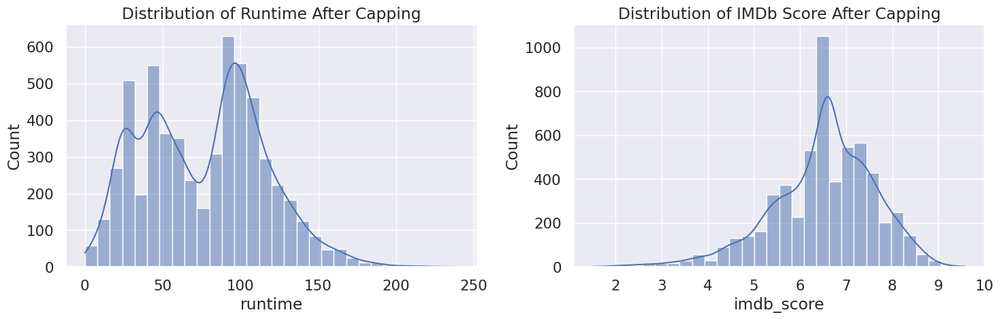

In [ ]:
capping_thresholds = {

    'runtime': (0, 300),

    'imdb_score': (0, 10),
    'imdb_votes': (0, None),
    'tmdb_popularity': (0, None),
    'tmdb_score': (0, 10)
}


for feature, (lower_cap, upper_cap) in capping_thresholds.items():
    if lower_cap is not None:
        df[feature] = df[feature].clip(lower=lower_cap)
    if upper_cap is not None:
        df[feature] = df[feature].clip(upper=upper_cap)


plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.histplot(data=df, x='runtime', bins=30, kde=True)
plt.title('Distribution of Runtime After Capping')

plt.subplot(1, 2, 2)
sns.histplot(data=df, x='imdb_score', bins=30, kde=True)
plt.title('Distribution of IMDb Score After Capping')

plt.tight_layout()
plt.show()

In [ ]:
df_duration = df.groupby(['runtime'])['id'].count().sort_values(ascending= False).reset_index()
df_duration

,runtime,id
0,24,127
1,90,126
2,44,102
3,25,98
4,95,97
...,...,...
197,168,1
198,185,1
199,154,1
200,176,1


# **Value_counts of Genre**

In [ ]:
df.genres.value_counts().to_frame().T

genres,comedy,documentation,drama,"comedy, drama","drama, romance",reality,"drama, comedy","comedy, documentation","comedy, romance","comedy, drama, romance",...,"war, drama, thriller, crime, european","drama, scifi, action, thriller, family","drama, crime, sport","comedy, drama, documentation","action, drama, sport, comedy","drama, war, action, thriller, history, european","thriller, crime, drama, western","drama, scifi, fantasy, horror","horror, fantasy, thriller","documentation, music, reality"
count,484,329,328,135,124,113,109,104,69,67,...,1,1,1,1,1,1,1,1,1,1


In [ ]:
categories = ", ".join(df['genres']).split(", ")
categories[:5]
category_wise_count = {}
for category in set(categories):
  category_wise_count[category] = categories.count(category)

category_wise_count

{'action': 1157,
 '': 59,
 'romance': 971,
 'documentation': 952,
 'family': 682,
 'horror': 378,
 'drama': 2968,
 'western': 41,
 'animation': 705,
 'scifi': 589,
 'reality': 234,
 'music': 262,
 'sport': 170,
 'war': 163,
 'history': 254,
 'thriller': 1228,
 'comedy': 2325,
 'european': 443,
 'crime': 936,
 'fantasy': 630}

In [ ]:
sorted_category_wise_count = sorted(category_wise_count.items(), key=lambda x: x[1])
sorted_category_wise_count[:4]

[('western', 41), ('', 59), ('war', 163), ('sport', 170)]

In [ ]:
sorted_category_wise_count[:10]

[('western', 41),
 ('', 59),
 ('war', 163),
 ('sport', 170),
 ('reality', 234),
 ('history', 254),
 ('music', 262),
 ('horror', 378),
 ('european', 443),
 ('scifi', 589)]

In [ ]:
sorted_category_wise_count[-10:]

[('fantasy', 630),
 ('family', 682),
 ('animation', 705),
 ('crime', 936),
 ('documentation', 952),
 ('romance', 971),
 ('action', 1157),
 ('thriller', 1228),
 ('comedy', 2325),
 ('drama', 2968)]

# **Ranking of Genre**

In [ ]:
top_10_most_occurred_categories = sorted_category_wise_count[-10:]
top_10_most_occurred_category_name = []
top_10_most_occurred_category_count = []
for tup in top_10_most_occurred_categories:
  top_10_most_occurred_category_name.append(tup[0])
  top_10_most_occurred_category_count.append(tup[1])
top_10_most_occurred_categories

[('fantasy', 630),
 ('family', 682),
 ('animation', 705),
 ('crime', 936),
 ('documentation', 952),
 ('romance', 971),
 ('action', 1157),
 ('thriller', 1228),
 ('comedy', 2325),
 ('drama', 2968)]

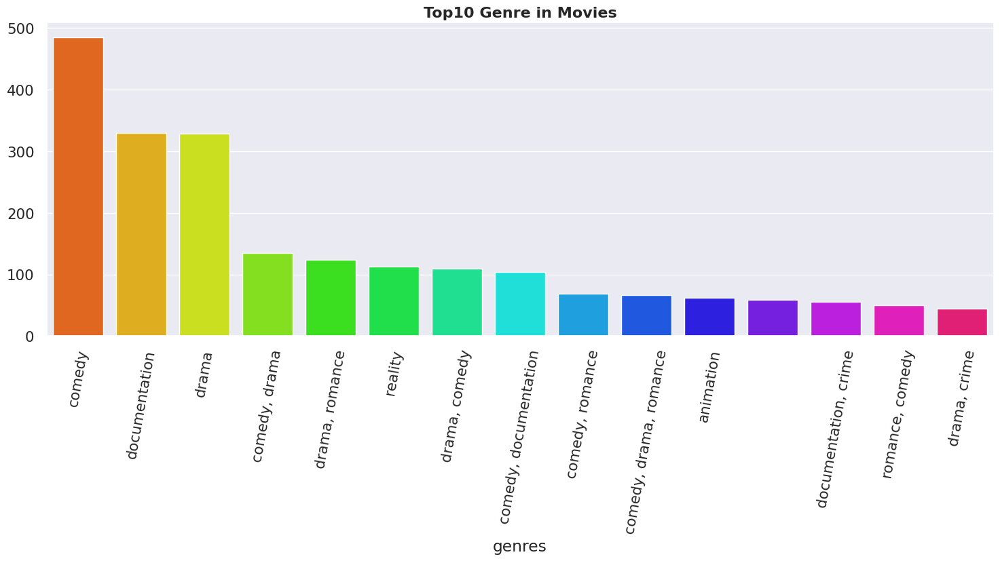

In [ ]:
plt.figure(figsize=(18,6))
sns.barplot(x = df["genres"].value_counts().head(15).index,
            y = df["genres"].value_counts().head(15).values,palette="hsv")
plt.xticks(rotation=80)
plt.title("Top10 Genre in Movies",size='16',fontweight="bold")
plt.show()

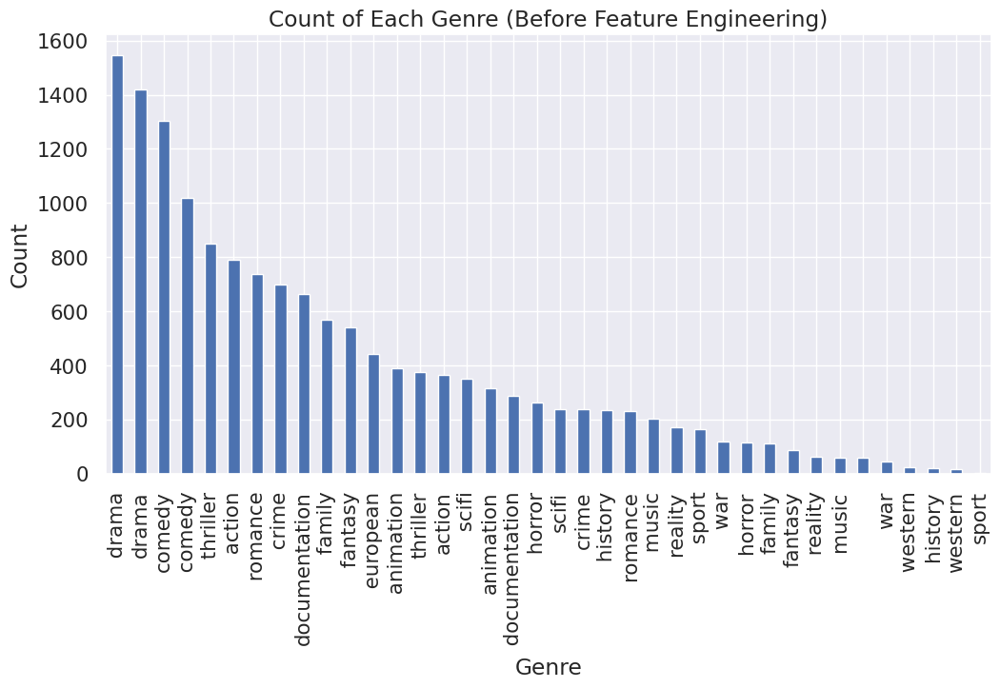

In [ ]:
plt.figure(figsize=(12, 6))
genres_df = df['genres'].str.split(',', expand=True).stack().reset_index(level=1, drop=True)
genres_df.value_counts().plot(kind='bar')
plt.xlabel('Genre')
plt.ylabel('Count')
plt.title('Count of Each Genre (Before Feature Engineering)')
plt.show()

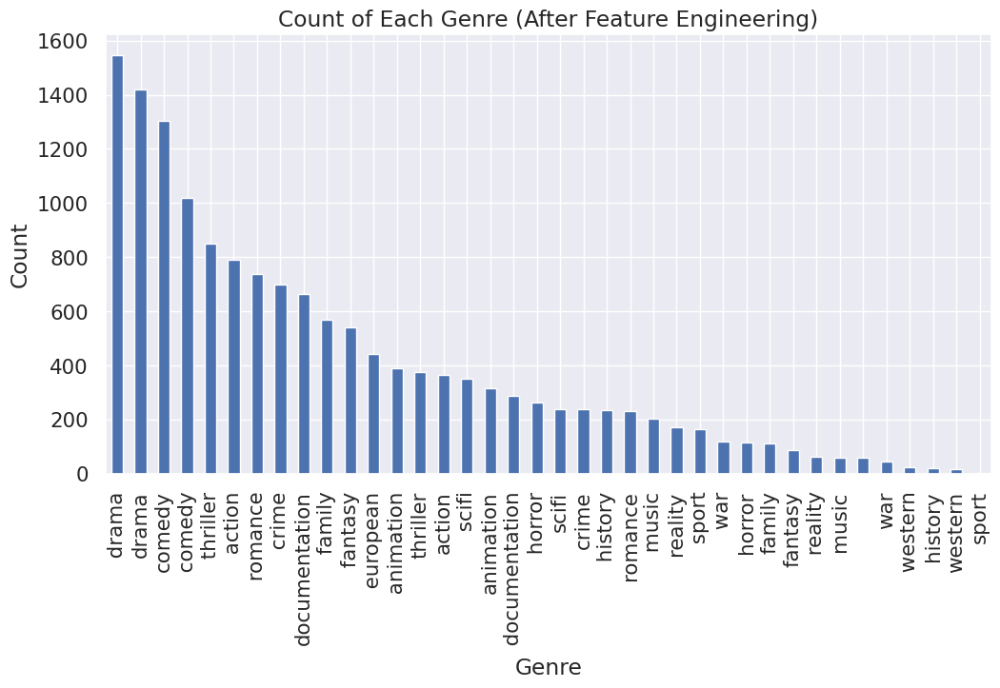

In [ ]:
df['title_length'] = df['title'].apply(len)

df['num_genres'] = df['genres'].apply(lambda x: len(x.split(',')) if pd.notna(x) else 0)

df['release_decade'] = (df['release_year'] // 10) * 10
plt.figure(figsize=(12, 6))
df['genres'].str.split(',', expand=True).stack().reset_index(level=1, drop=True).value_counts().plot(kind='bar')
plt.xlabel('Genre')
plt.ylabel('Count')
plt.title('Count of Each Genre (After Feature Engineering)')
plt.show()

# **Demographic of shows by Country**

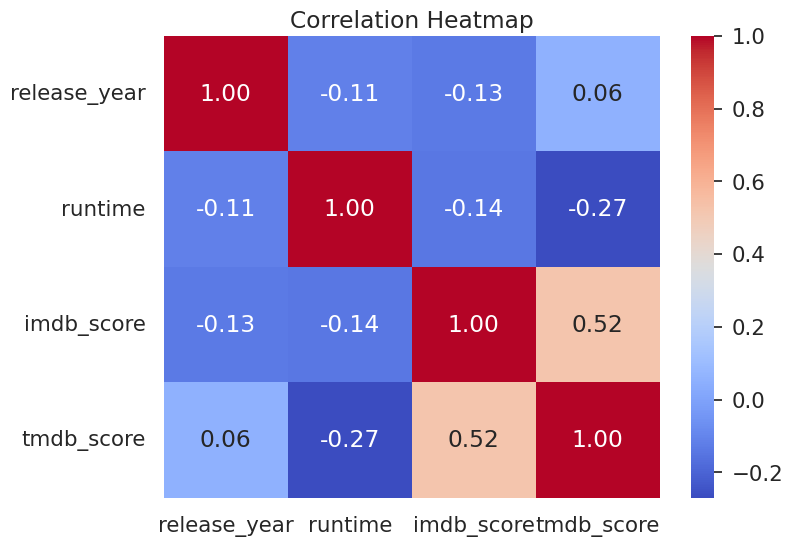

In [ ]:
numerical_cols = ['release_year', 'runtime', 'imdb_score', 'tmdb_score']

correlation_matrix = raw_data[numerical_cols].corr()
correlation_matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

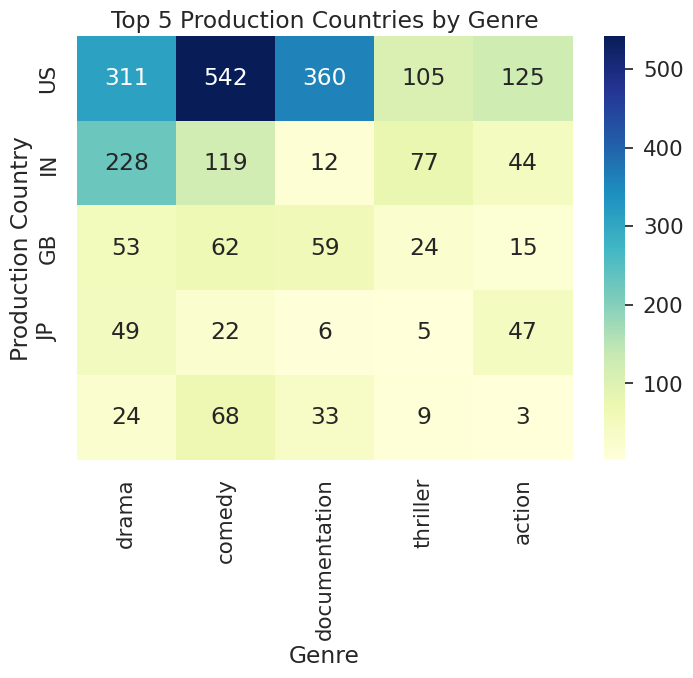

In [ ]:
crosstab = pd.crosstab(df['production_country'], df['genre'])

top_countries = crosstab.sum(axis=1).sort_values(ascending=False)[:5].index

top_genres = crosstab.sum(axis=0).sort_values(ascending=False)[:5].index

sns.heatmap(crosstab.loc[top_countries, top_genres], annot=True, fmt='d', cmap='YlGnBu')

plt.xlabel('Genre')
plt.ylabel('Production Country')
plt.title('Top 5 Production Countries by Genre')

plt.show()


# **Top Shows by Rating**

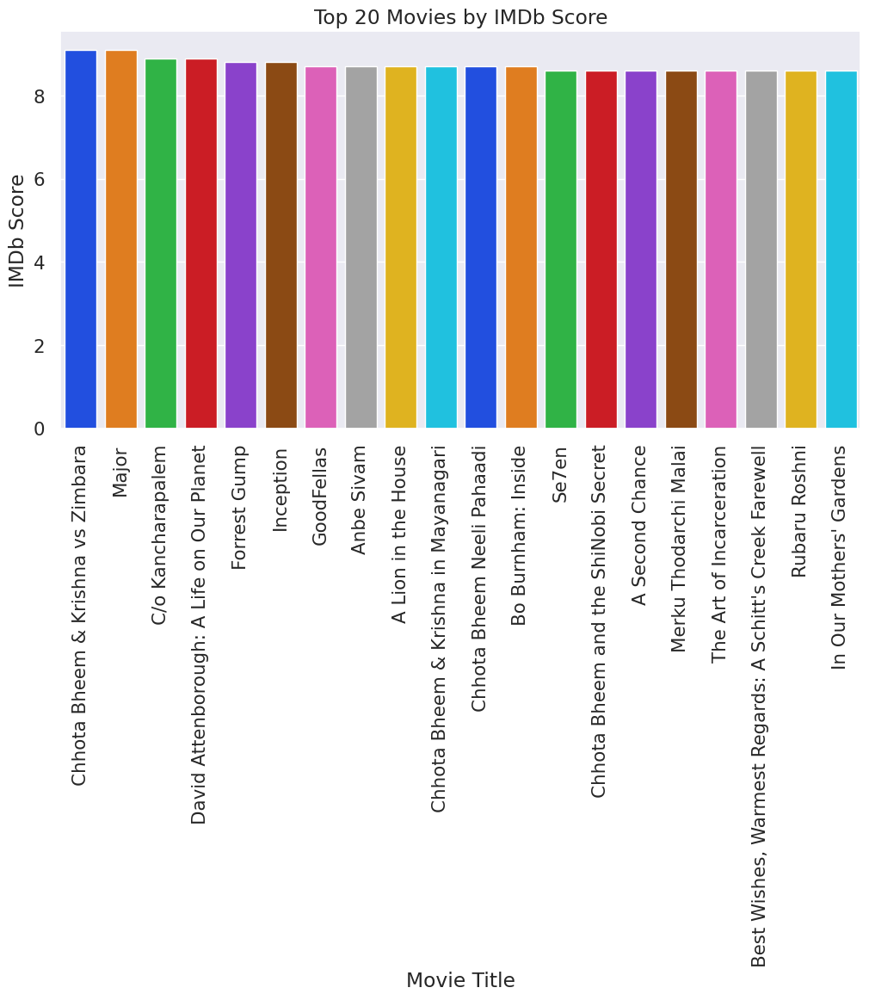

In [ ]:
top_20_movies = df_movies.nlargest(20, 'imdb_score')
plt.figure(figsize=(12, 6))
sns.barplot(data=top_20_movies, x='title', y='imdb_score', palette='bright')
plt.xticks(rotation=90)
plt.xlabel('Movie Title')
plt.ylabel('IMDb Score')
plt.title('Top 20 Movies by IMDb Score')
plt.show()


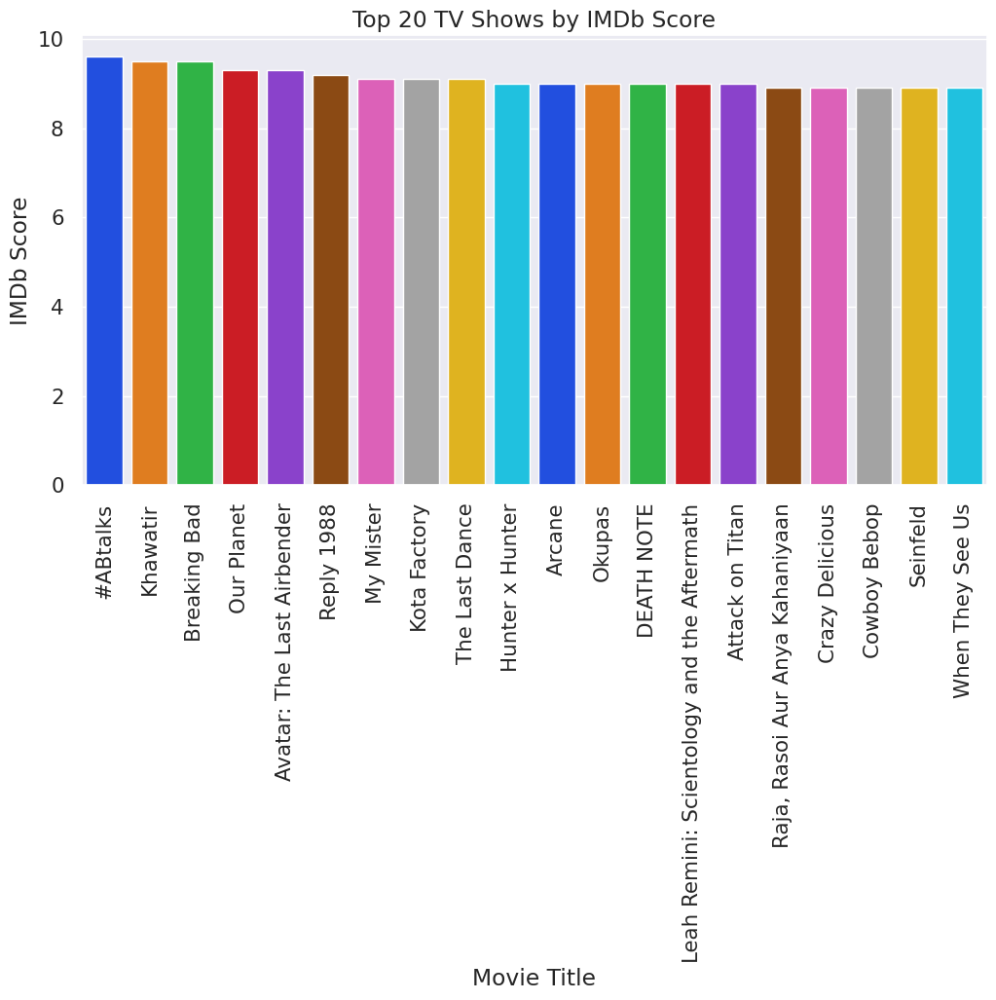

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(data=df_tv_show.sort_values('imdb_score', ascending=False).head(20), x='title', y='imdb_score', palette='bright')
plt.xlabel('Movie Title')
plt.ylabel('IMDb Score')
plt.title('Top 20 TV Shows by IMDb Score')
plt.xticks(rotation=90)
plt.show()

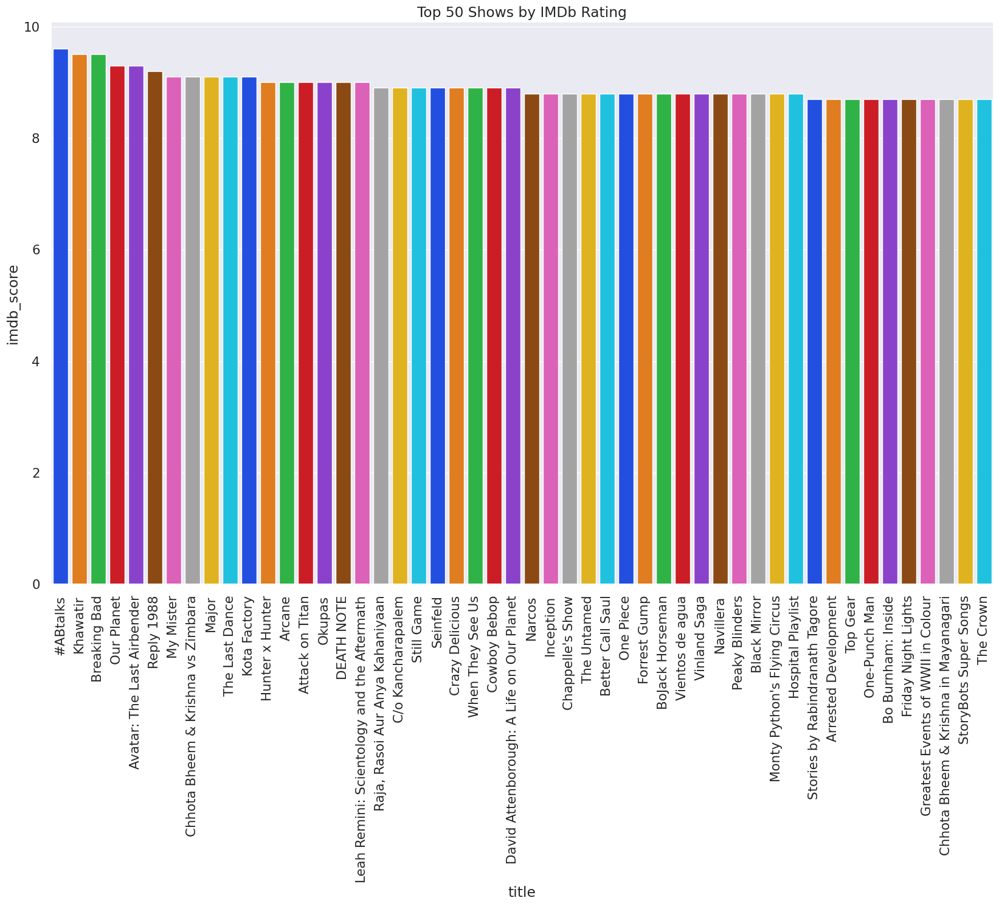

In [ ]:
df_top_shows = df.sort_values(by='imdb_score', ascending=False).head(50)
plt.figure(figsize=(20, 12))
sns.barplot(x='title', y='imdb_score', data=df_top_shows,palette="bright")
plt.xticks(rotation=90)
plt.title('Top 50 Shows by IMDb Rating')
plt.show()

<a id='sexvoutcome'></a>

<a id='features'></a>

# **Feature Engineering**




# **Rename data file to work clean**

In [ ]:
data=raw_data
data.head()



,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,...,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,genre,production_country,target_ages,title_length,num_genres,release_decade
0,ts300399,Five Came Back: The Reference Films,SHOW,This collection includes 12 World War II-era p...,2016.417094,TV-MA,51,documentation,US,1.0,...,6.6,2233.5,0.600,6.900,documentation,US,Adults,35,1,2010.0
1,tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works ...,2016.417094,R,114,"drama, crime",US,1.0,...,8.2,808582.0,40.965,8.179,drama,US,Adults,11,2,2010.0
2,tm154986,Deliverance,MOVIE,Intent on seeing the Cahulawassee River before...,2016.417094,R,109,"drama, action, thriller, european",US,1.0,...,7.7,107673.0,10.010,7.300,drama,US,Adults,11,4,2010.0
3,tm127384,Monty Python and the Holy Grail,MOVIE,"King Arthur, accompanied by his squire, recrui...",2016.417094,PG,91,"fantasy, action, comedy",GB,1.0,...,8.2,534486.0,15.461,7.811,fantasy,GB,Older Kids,31,3,2010.0
4,tm120801,The Dirty Dozen,MOVIE,12 American military prisoners in World War II...,2016.417094,TV-MA,150,"war, action","GB, US",1.0,...,7.7,72662.0,20.398,7.600,war,GB,Adults,15,2,2010.0


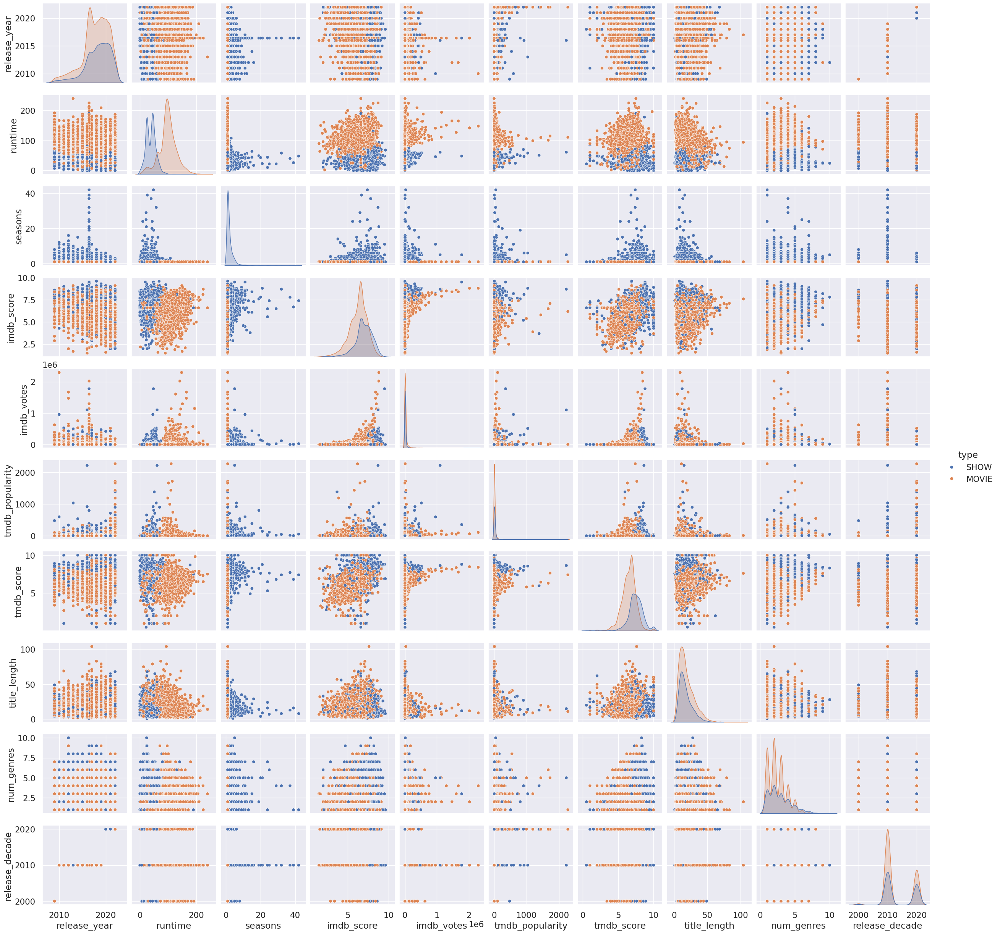

In [ ]:

sns.pairplot(data, hue='type')
plt.show()


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5850 entries, 0 to 5849
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    5850 non-null   object 
 1   title                 5850 non-null   object 
 2   type                  5850 non-null   object 
 3   description           5850 non-null   object 
 4   release_year          5850 non-null   float64
 5   age_certification     5850 non-null   object 
 6   runtime               5850 non-null   int64  
 7   genres                5850 non-null   object 
 8   production_countries  5850 non-null   object 
 9   seasons               5850 non-null   float64
 10  imdb_id               5850 non-null   object 
 11  imdb_score            5850 non-null   float64
 12  imdb_votes            5850 non-null   float64
 13  tmdb_popularity       5850 non-null   float64
 14  tmdb_score            5850 non-null   float64
 15  genre                

In [ ]:
data.isnull().sum()


id                      0
title                   0
type                    0
description             0
release_year            0
age_certification       0
runtime                 0
genres                  0
production_countries    0
seasons                 0
imdb_id                 0
imdb_score              0
imdb_votes              0
tmdb_popularity         0
tmdb_score              0
genre                   0
production_country      0
target_ages             0
title_length            0
num_genres              0
release_decade          0
dtype: int64

In [94]:
# prompt: generate pptx

from pptx import Presentation
from pptx.util import Inches

# Create a new presentation
prs = Presentation()

# Create a new slide
slide = prs.slides.add_slide(prs.slide_layouts[0])

# Add a title to the slide
title = slide.shapes.add_textbox(Inches(0.5), Inches(0.5), Inches(8), Inches(1))
title_text = title.text_frame.paragraphs[0]
title_text.text = "PowerPoint Presentation"
title_text.font.size = Pt(28)
title_text.font.name = "Arial"

# Add a subtitle to the slide
subtitle = slide.shapes.add_textbox(Inches(0.5), Inches(1.75), Inches(8), Inches(1))
subtitle_text = subtitle.text_frame.paragraphs[0]
subtitle_text.text = "Generated using Python-pptx"
subtitle_text.font.size = Pt(18)
subtitle_text.font.name = "Arial"

# Add a picture to the slide


# Save the presentation
prs.save("presentation.pptx")


# **Clean and combine text from entries**

In [ ]:
import re

def cleaned(x):
    return re.sub(r"[^a-zA-Z ]", "", str(x))

data['organized'] =  data['description'] + ' ' + data['genres'] + ' '  + data['production_countries']+ ' '


In [ ]:
import re
def cleaned(x):
    return re.sub(r"[^a-zA-Z ]","",str(x))
data['organized'] = data['organized'].apply(cleaned)

In [ ]:
data['organized'][0]

'This collection includes  World War IIera propaganda films  many of which are graphic and offensive  discussed in the docuseries Five Came Back documentation US '

In [ ]:
data['organized']= data['organized'].str.lower()

In [ ]:
import string

def remove_punctuation(text):
    translator = str.maketrans('', '', string.punctuation)
    text = text.translate(translator)
    return text

data['organized'] = data['organized'].apply(remove_punctuation)

In [ ]:
data['organized'][0]


'this collection includes  world war iiera propaganda films  many of which are graphic and offensive  discussed in the docuseries five came back documentation us '

In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:


def remove_stopwords(text):
    words = nltk.word_tokenize(text)
    words = [word for word in words if word.lower() not in stopwords.words('english')]
    text = ' '.join(words)
    return text

data['organized'] = data['organized'].apply(remove_stopwords)

In [ ]:
data['organized'][0]


In [ ]:
stemmer = SnowballStemmer('english')
stop_words = set(stopwords.words('english'))

In [ ]:
def stem_text(text):
    words = nltk.word_tokenize(text)
    stemmed_words = [stemmer.stem(word) for word in words]
    return ' '.join(stemmed_words)


data['org_new'] = data['organized'].apply(stem_text)

In [ ]:
new_df = data[['title', 'org_new']]
new_df.head()

In [ ]:
X.shape

# **Convert to numpy array**

 Model Evaluation:

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

X_train, X_test, y_train, y_test = train_test_split(data[['imdb_score', 'tmdb_score']], data['type'], test_size=0.2)

model = RandomForestClassifier()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

In [ ]:
model_predict = model.predict(X_test)
from sklearn.metrics import classification_report, f1_score
print(classification_report(y_test, model_predict))

In [ ]:
precision_train = precision_score(y_train, model.predict(X_train), average='weighted')
precision_test = precision_score(y_test, model.predict(X_test), average='weighted')
recall_train = recall_score(y_train, model.predict(X_train), average='weighted')
recall_test = recall_score(y_test, model.predict(X_test), average='weighted')
f1_train = f1_score(y_train, model.predict(X_train), average='weighted')
f1_test = f1_score(y_test, model.predict(X_test), average='weighted')

print("Training Accuracy Scores:", model.score(X_train,y_train) * 100, "%")
print("Test Accuracy Scores:", model.score(X_test,y_test) * 100, "%")
print("Precision_train:", precision_train * 100, "%")
print("Precision_test:", precision_test * 100, "%")
print("Recall_train:", recall_train * 100, "%")
print("Recall_test:", recall_test * 100, "%")
print("F1-score_train:", f1_train * 100, "%")
print("F1-score_test:", f1_test * 100, "%")

# **Apply TF-IDF Vectorisation**

In [ ]:
X.toarray()

In [ ]:
t_vectorizer = TfidfVectorizer(max_features=20000)
X= t_vectorizer.fit_transform(new_df['org_new'])



```
```

### Dimensionality Reduction


# **PCA**

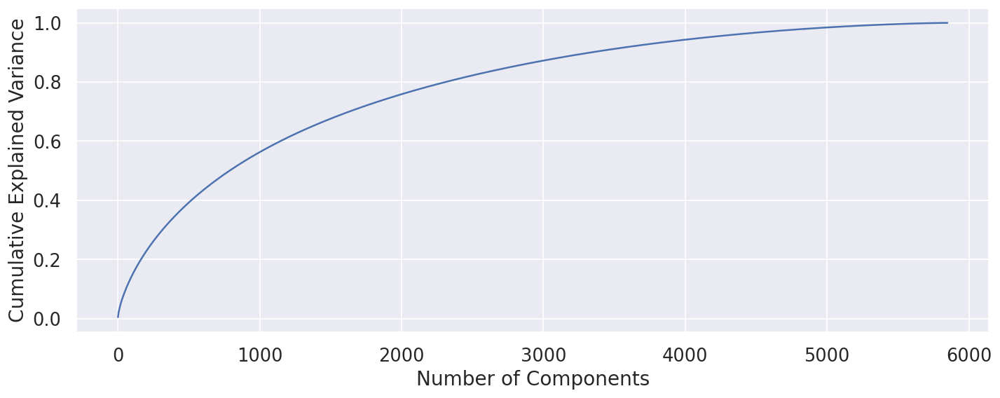

In [154]:
pca = PCA()
pca.fit(X.toarray())

plt.figure(figsize=(14,5), dpi=120)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

# **Set value to 95% to explain most variances**

In [124]:
pca_tuned = PCA(n_components=0.95)
pca_tuned.fit(X.toarray())
X_transformed = pca_tuned.transform(X.toarray())
X_transformed.shape

(5850, 4130)

# **By tuning the PCA to 95% we have 5850 observations and 4130 features.**

**KMeans Clustering**

**Elbow**

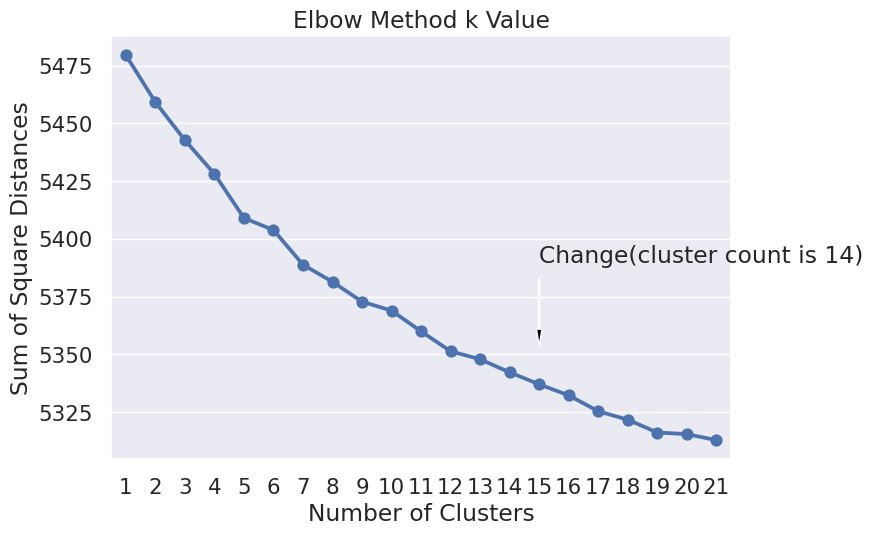

In [125]:
sum_of_sq_dist = {}
for k in range(1,22):
    km = KMeans(n_clusters= k, init= 'k-means++', max_iter= 300, n_init=10, random_state=0)
    km = km.fit(X_transformed)
    sum_of_sq_dist[k] = km.inertia_
arrow_properties = dict(
    facecolor="black", width=0.5,
    headwidth=4, shrink=0.1)

plt.annotate(
    "Change(cluster count is 14)", xy=(14, 5350),
    xytext=(14, 5390),
    arrowprops=arrow_properties)
sns.pointplot(x = list(sum_of_sq_dist.keys()), y = list(sum_of_sq_dist.values()))
plt.xlabel('Number of Clusters')
plt.ylabel('Sum of Square Distances')
plt.title('Elbow Method k Value')
plt.show()

# As shown, at 14 clusters the difference in values becomes less dramatic

In [ ]:
for n_cluster in range(4,15):
    kmeans = KMeans(n_clusters=n_cluster)
    kmeans.fit(X_transformed)
    score = kmeans.score(X_transformed)
    print(f"Number of Cluster: {n_cluster}, Score: {score}")

# **Plotting clusters and assigning values**

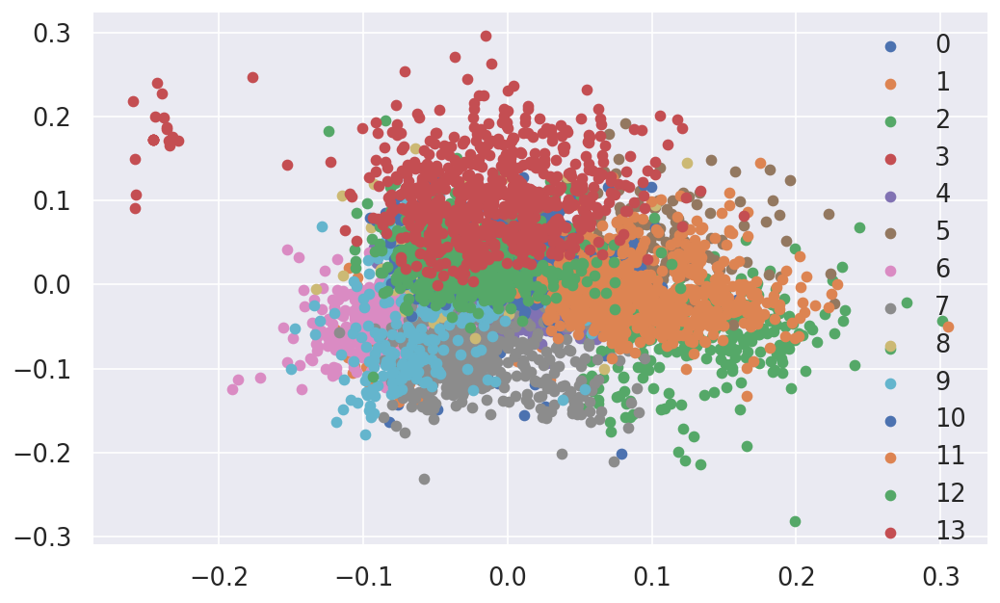

In [127]:
plt.figure(figsize=(10,6), dpi=120)

kmeans= KMeans(n_clusters=14, init= 'k-means++', random_state=9)
kmeans.fit(X_transformed)

label = kmeans.fit_predict(X_transformed)
unique_labels = np.unique(label)

for i in unique_labels:
    plt.scatter(X_transformed[label == i , 0] , X_transformed[label == i , 1] , label = i)
plt.legend()
plt.show()

# **Adding Cluster Number column to dataset**

In [ ]:
data['cluster_number'] = kmeans.labels_

In [ ]:
data.head(3)

# **Generating Wordcloud associated to each cluster by description and listed_in**

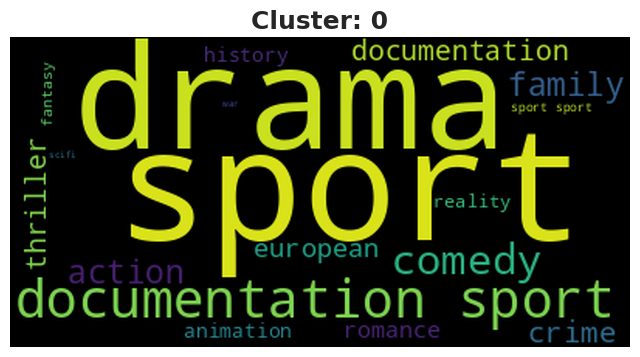

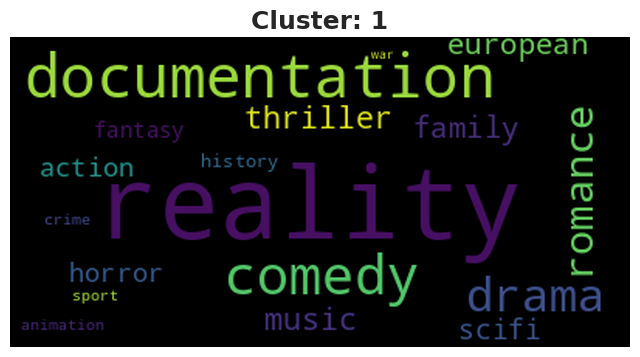

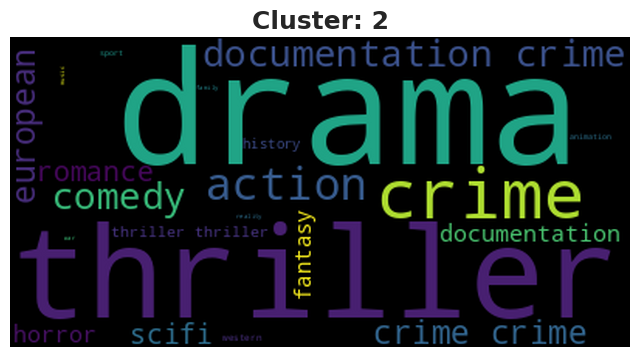

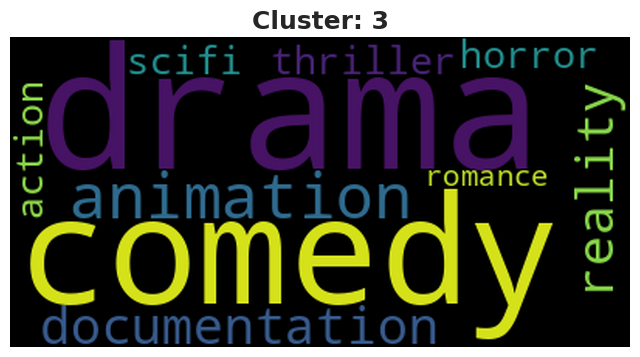

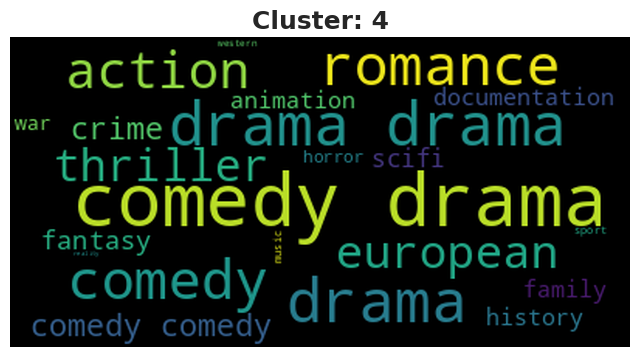

...

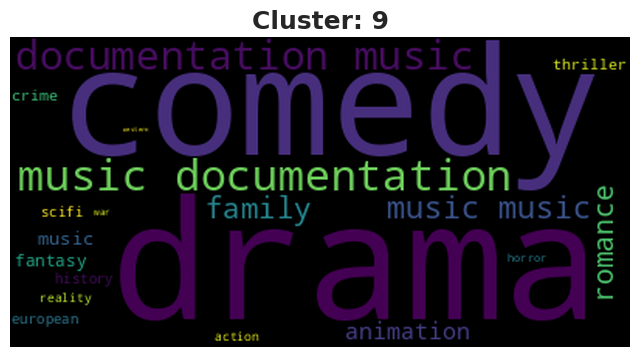

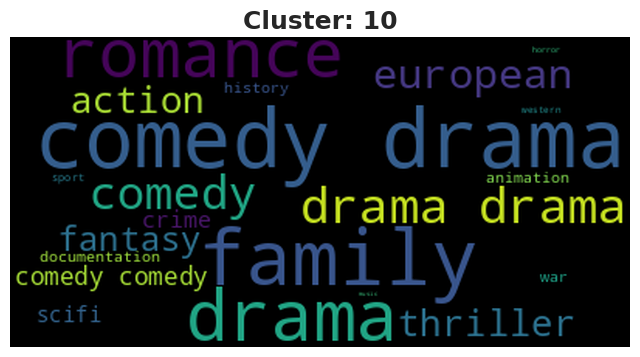

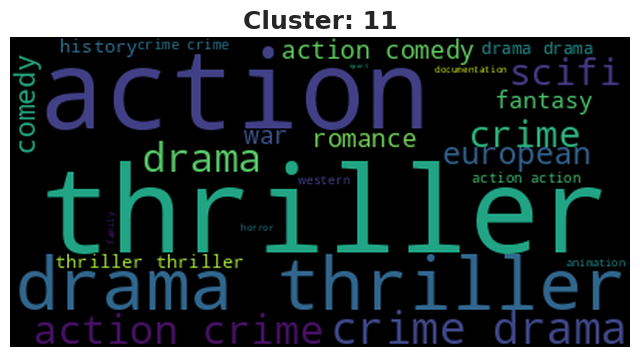

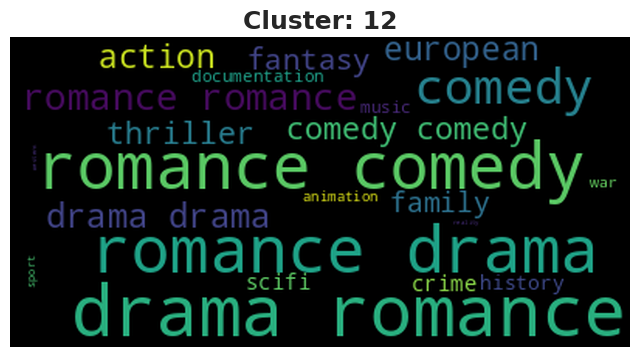

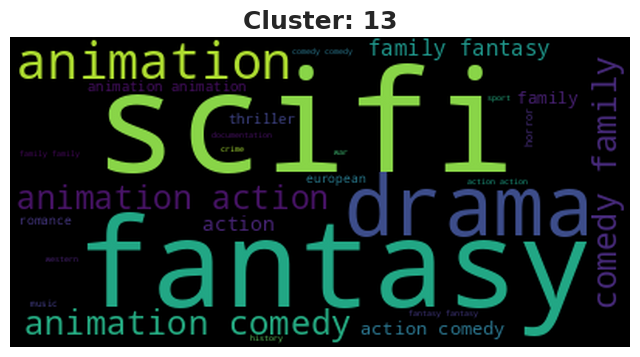

In [130]:
def func_select_Category(cluster_label,column_of_choice):
  df_word_cloud = data[['cluster_number',column_of_choice]].dropna()
  df_word_cloud = df_word_cloud[df_word_cloud['cluster_number']==cluster_label]
  text = " ".join(word for word in df_word_cloud[column_of_choice])
  stopwords = set(STOPWORDS)
  wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
  plt.imshow(wordcloud, interpolation='blackman')
  plt.title(f'Cluster: {i}', fontsize=18, fontweight='bold')
  plt.axis("off")
  plt.show()

for i in range(14):
  func_select_Category(i,'genres')

Cluster 0 contains the maximum number of Sports, Drama

Cluster 1 contains the maximum number of Reality, Documentation

Cluster 2 contains the maximum number of Thriller, Drama

Cluster 3 contains the maximum number of Comedy, Animation

Cluster 4 contains the maximum number of Romance, Comedy, Drama

Cluster 5 contains the maximum number of Fantasy Horror, Thriller

Cluster 6 contains the maximum number of Comedy Documentation

Cluster 7 contains the maximum number of European Documentation  

Cluster 8 contains the maximum number of Romance Drama

Cluster 9 contains the maximum number of Music Documentation

Cluster 10 contains the maximum number of Family, Romantic

Cluster 11 contains the maximum number of Action, Thriller

Cluster 12 contains the maximum number of Action, Thriller

Cluster 13 contains the maximum number of Romance Drama, Romance Comedy

Cluster 14 contains the maximum number of Romance SciFi, Fantasy, Animation




In [ ]:
for i in range(14):
  func_select_Category(i,'description')

# **Silhouette Clusters**

In [ ]:
model = KMeans(random_state=5)
visualizer = KElbowVisualizer(model, k=(4,22), metric='silhouette', timings=False, locate_elbow=False)

visualizer.fit(X_transformed)
visualizer.show()

In [ ]:
def silhouette_score_analysis(n):

  for n_clusters in range(2,n):
      km = KMeans (n_clusters=n_clusters, random_state=5)
      preds = km.fit_predict(X_transformed)
      centers = km.cluster_centers_

      score = silhouette_score(X_transformed, preds, metric='euclidean')
      print ("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))

      visualizer = SilhouetteVisualizer(km)

      visualizer.fit(X_transformed)
      visualizer.poof()

For n_clusters = 2, silhouette score is 0.0025707933077577477


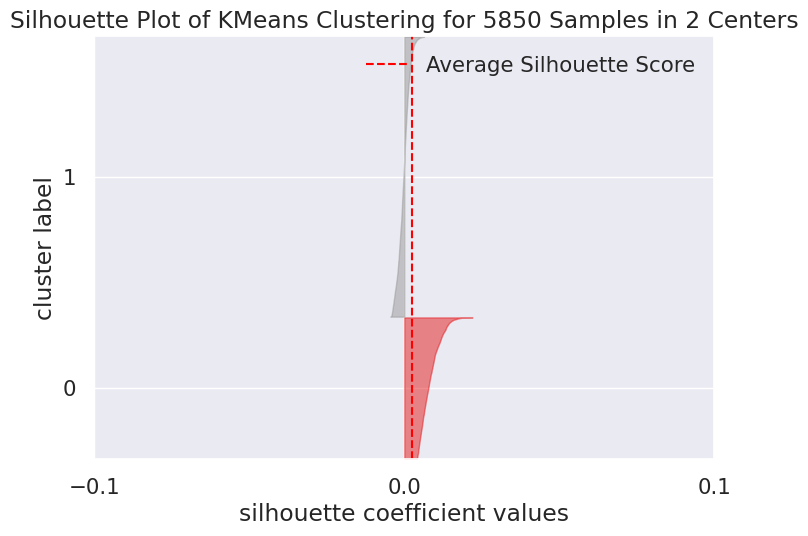

For n_clusters = 3, silhouette score is 0.0023330633147819182


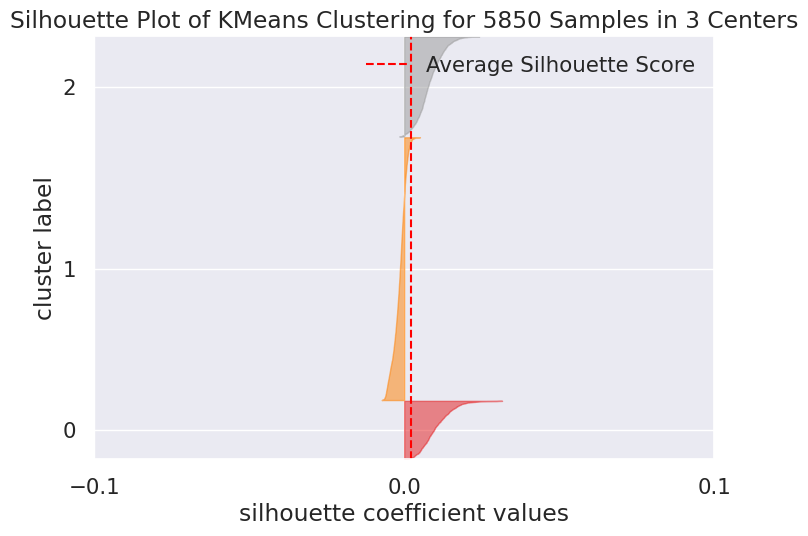

For n_clusters = 4, silhouette score is 0.003642176242451308


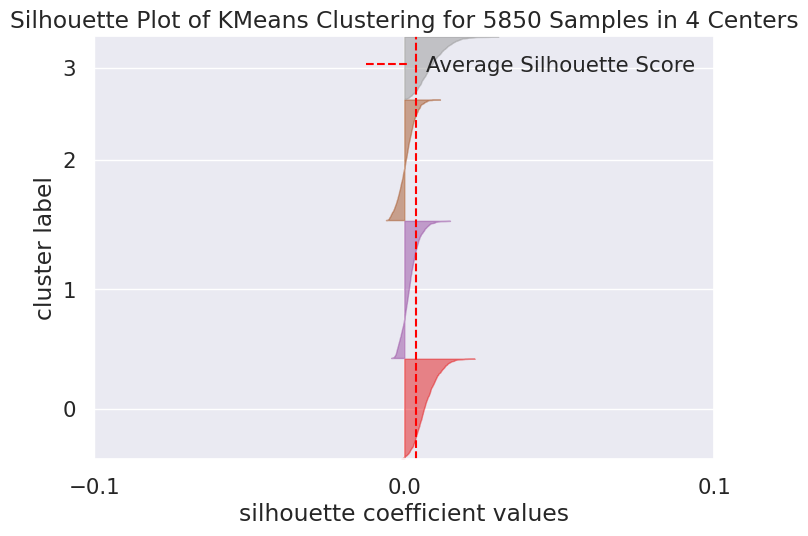

For n_clusters = 5, silhouette score is 0.004495213688657699


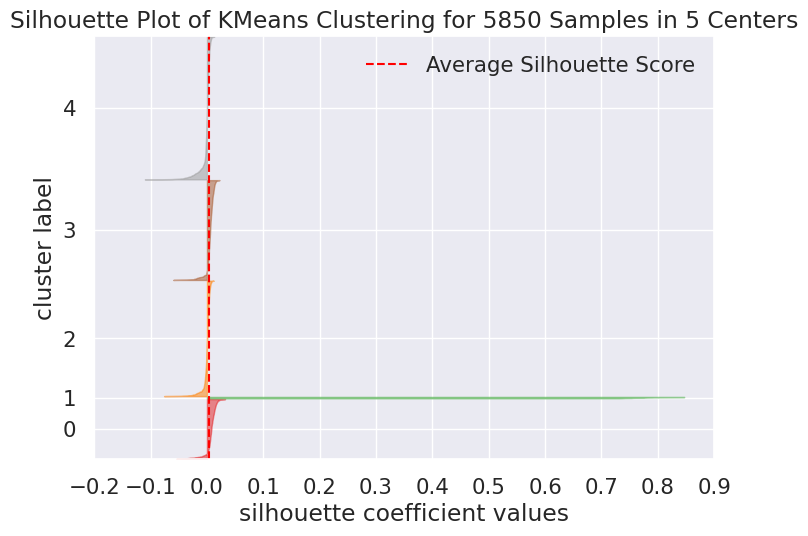

For n_clusters = 6, silhouette score is 0.003750475305838072


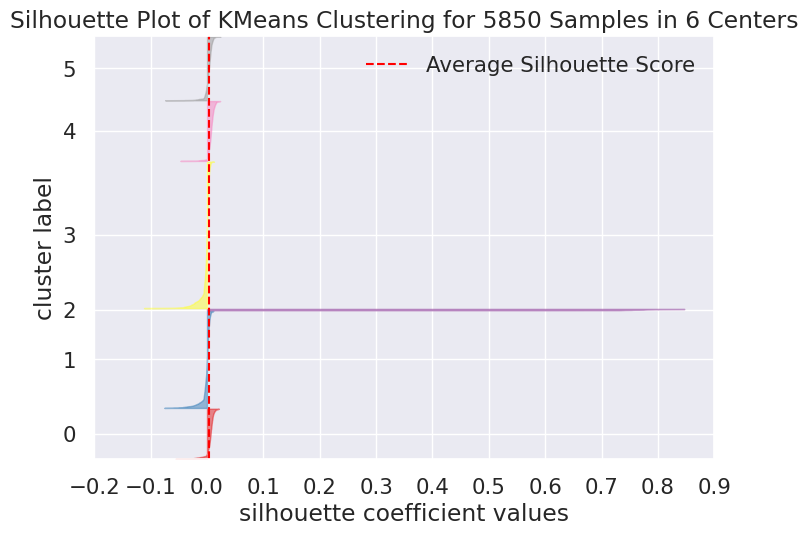

For n_clusters = 7, silhouette score is 0.004450448613908199


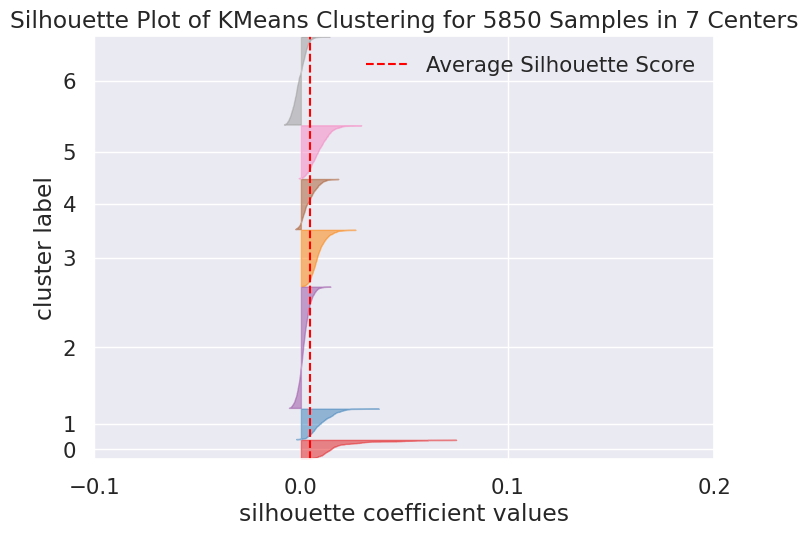

For n_clusters = 8, silhouette score is 0.003879182171767961


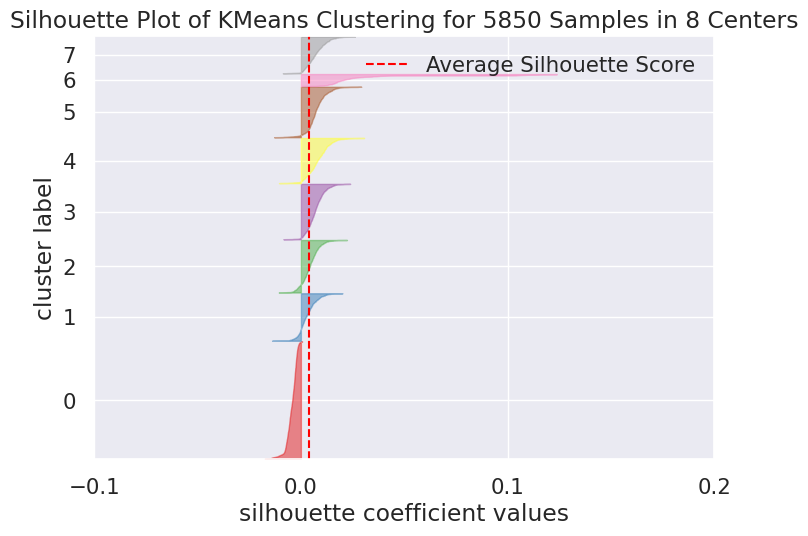

For n_clusters = 9, silhouette score is 0.004430096489514928


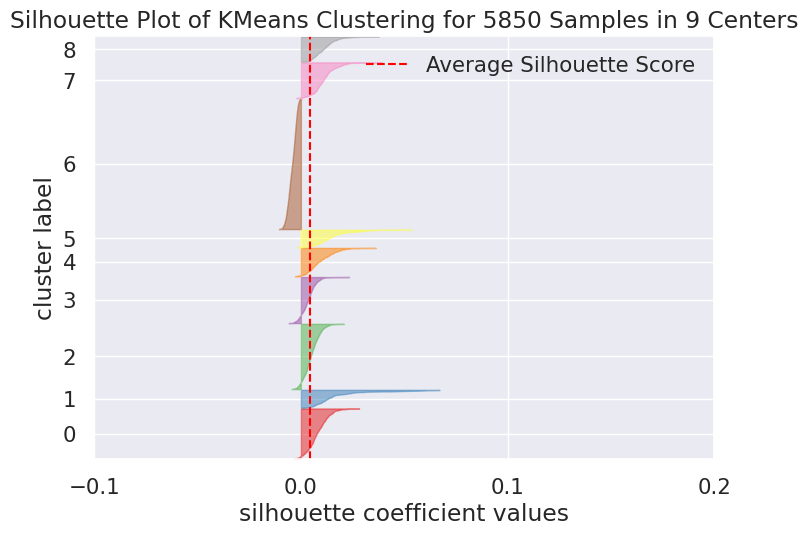

For n_clusters = 10, silhouette score is 0.004824681264964462


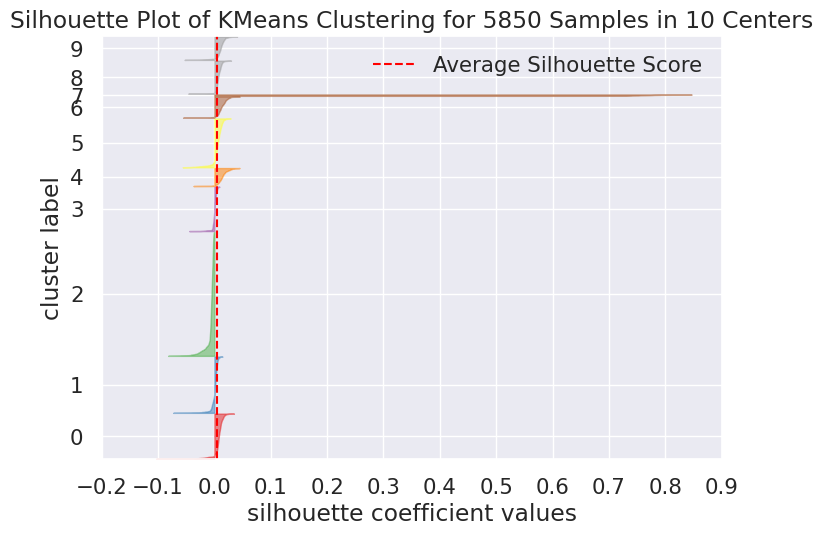

For n_clusters = 11, silhouette score is 0.005119388687503089


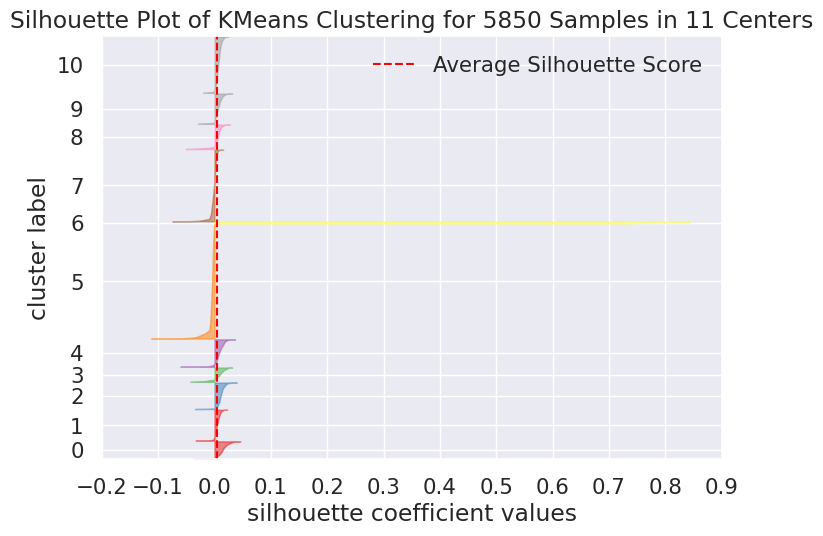

For n_clusters = 12, silhouette score is 0.005665666754476633


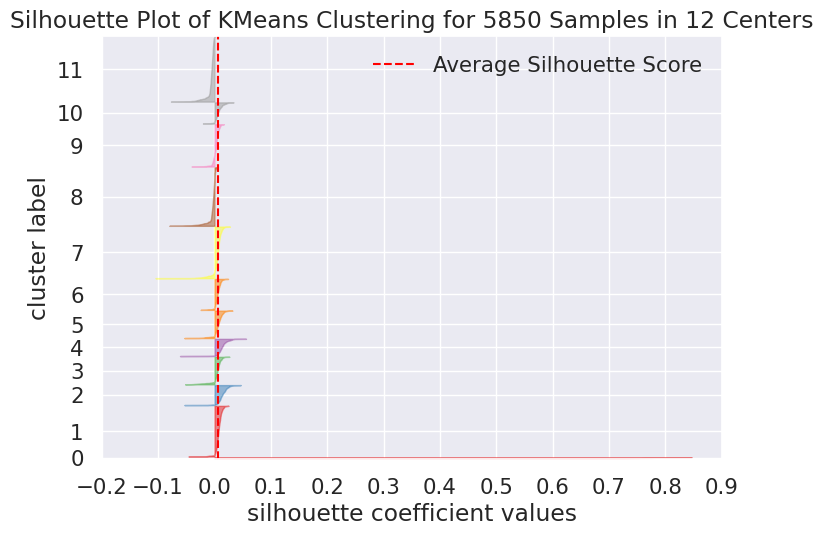

For n_clusters = 13, silhouette score is 0.005207019955730326


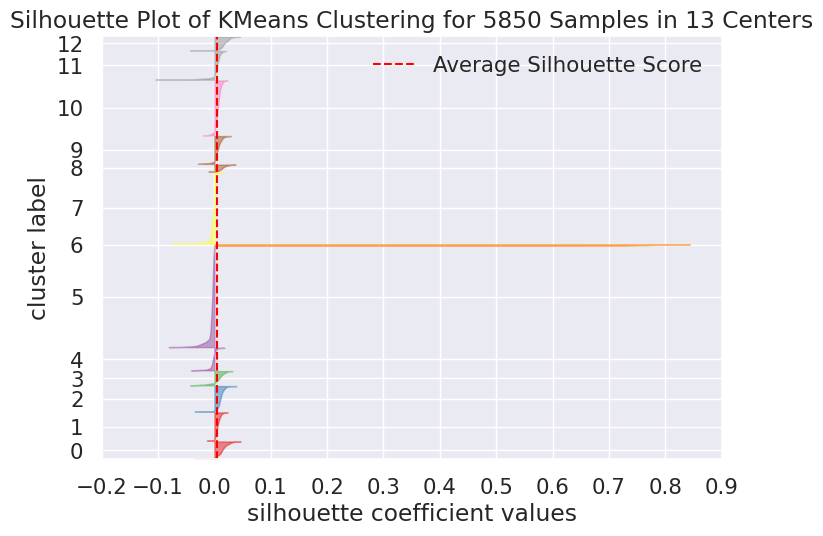

For n_clusters = 14, silhouette score is 0.005405830358270955


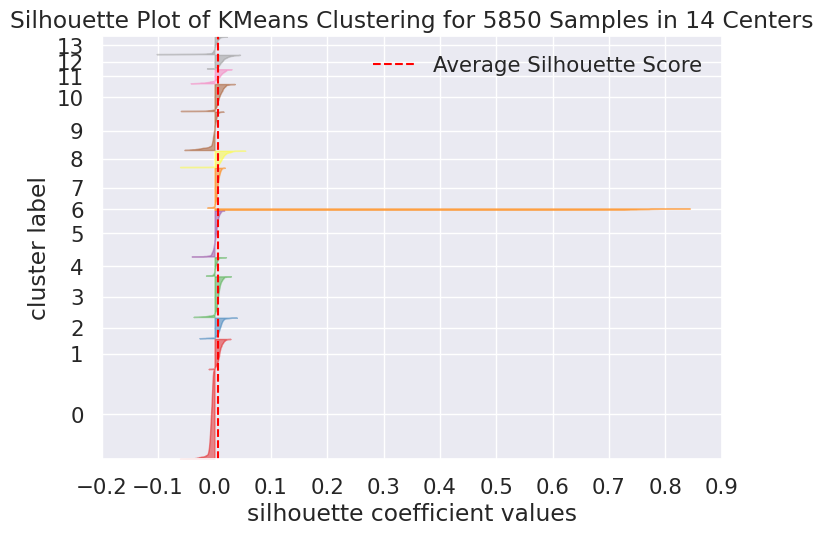

In [134]:
silhouette_score_analysis(15)

# **Silhouette Score for each k**

In [ ]:
k_range = range(5, 16)

In [136]:
from sklearn.cluster import AgglomerativeClustering
for k in k_range:
    model = AgglomerativeClustering(n_clusters=k)
    labels = model.fit_predict(X_transformed)
    score = silhouette_score(X, labels)
    print("k=%d, Silhouette score=%f" % (k, score))

k=5, Silhouette score=-0.001253
k=6, Silhouette score=-0.001120
k=7, Silhouette score=-0.001204
k=8, Silhouette score=-0.001129
k=9, Silhouette score=-0.001276
k=10, Silhouette score=-0.001184
k=11, Silhouette score=-0.001314
k=12, Silhouette score=-0.001575
k=13, Silhouette score=-0.001579
k=14, Silhouette score=-0.001709
k=15, Silhouette score=-0.001493


# **Silhouette score was hightest at 14 clusters**

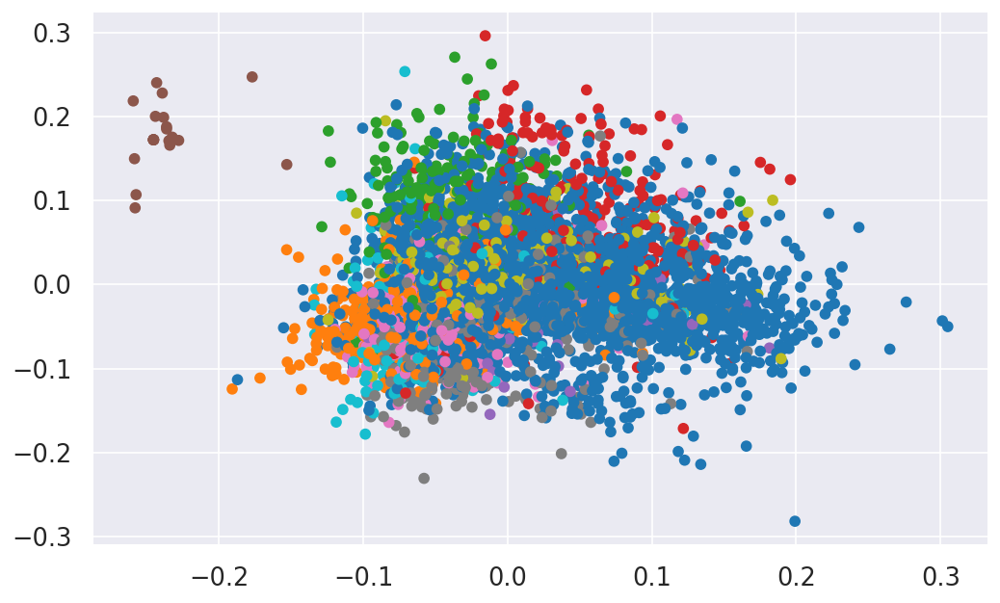

In [137]:
model = AgglomerativeClustering(n_clusters = 14, affinity = 'euclidean', linkage = 'ward')
labels = model.fit_predict(X_transformed)
plt.figure(figsize=(10,6), dpi=120)
plt.scatter(X_transformed[:, 0], X_transformed[:, 1], c=labels, cmap='tab10')
plt.legend()
plt.show()

In [138]:
data['cluster_number_agg_clustering'] = model.labels_

In [139]:
def func_select_Category_agg_clustering1(cluster_label,column_of_choice):
  df_word_cloud = data[['cluster_number_agg_clustering',column_of_choice]].dropna()
  df_word_cloud = df_word_cloud[df_word_cloud['cluster_number_agg_clustering']==cluster_label]
  text = " ".join(word for word in df_word_cloud[column_of_choice])
  stopwords = set(STOPWORDS)
  wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
  plt.imshow(wordcloud, interpolation='blackman')
  plt.title(f'Cluster: {i}', fontsize=18, fontweight='bold')
  plt.axis("off")
  plt.show()

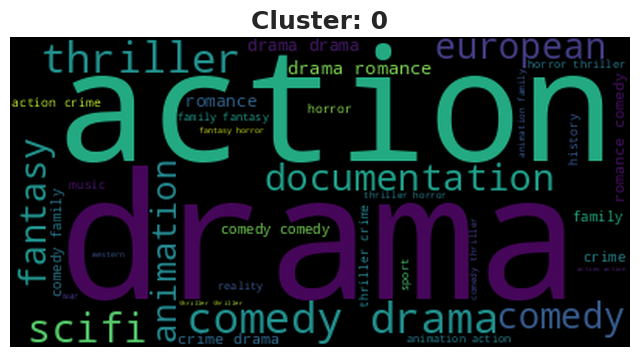

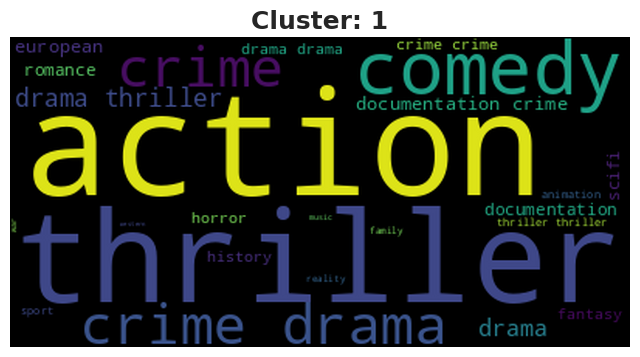

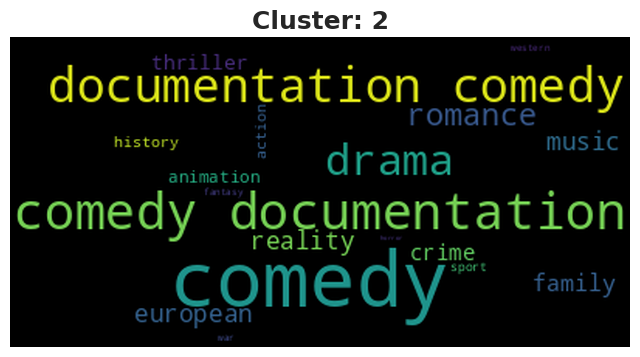

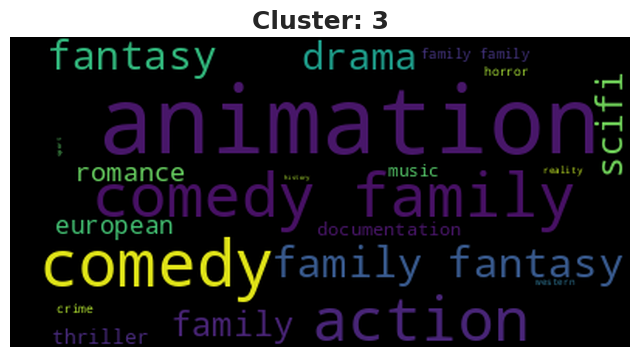

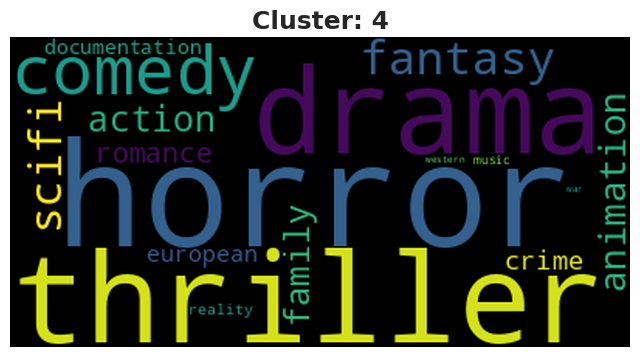

...

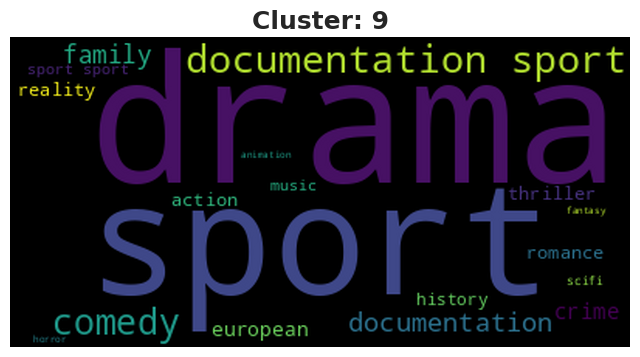

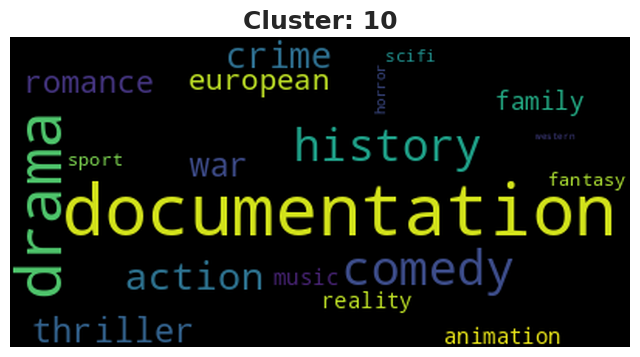

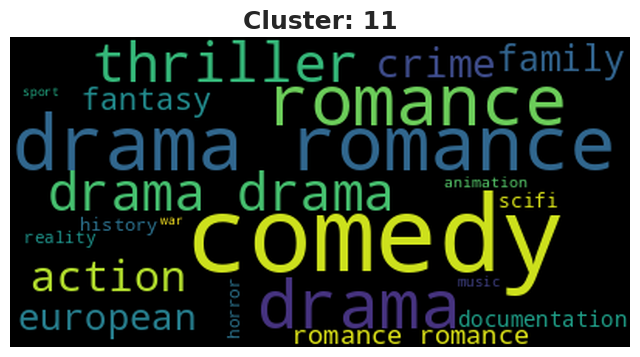

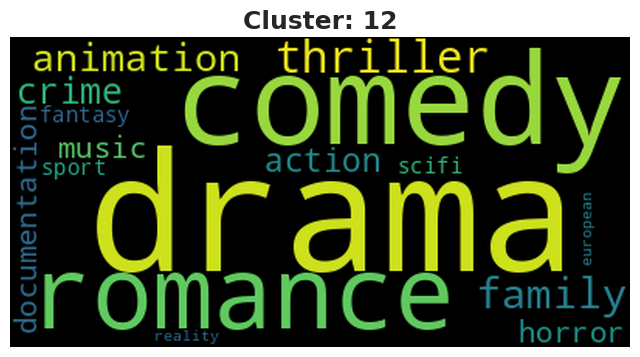

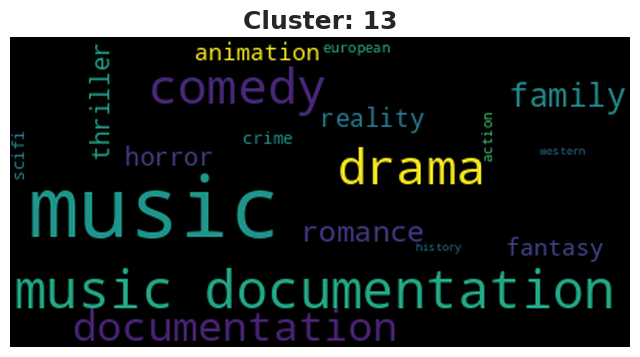

In [140]:
for i in range(14):
  func_select_Category_agg_clustering1(i,'genres')

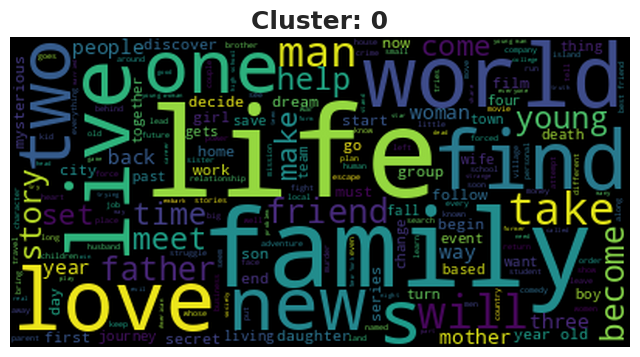

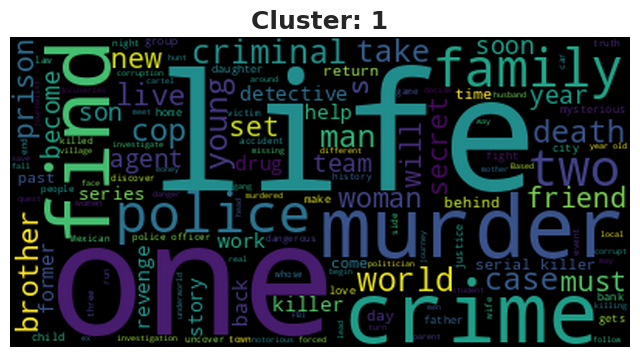

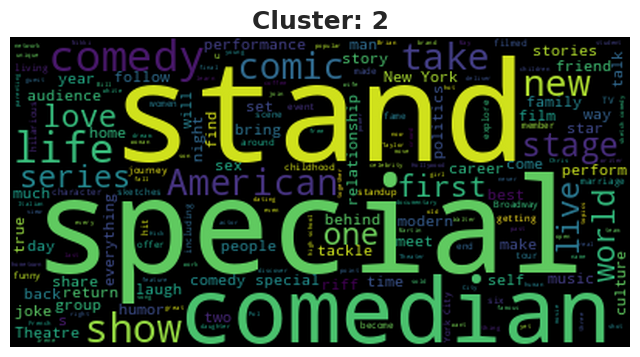

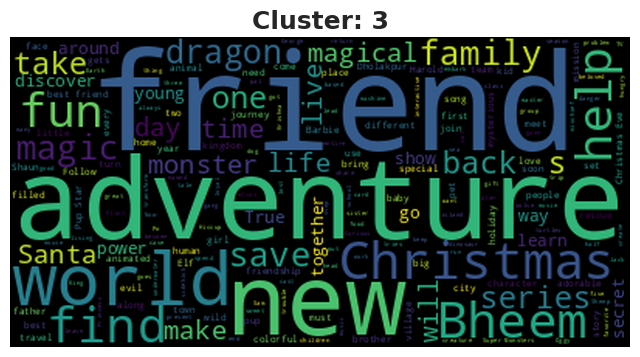

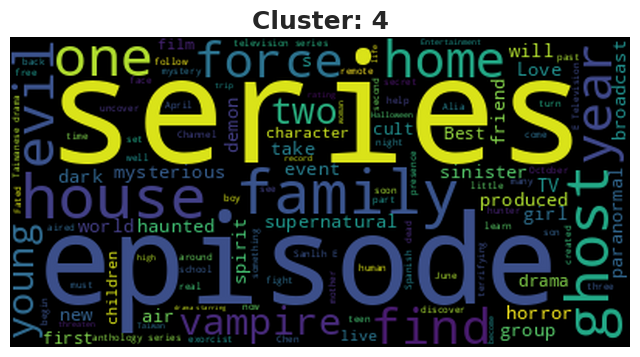

...

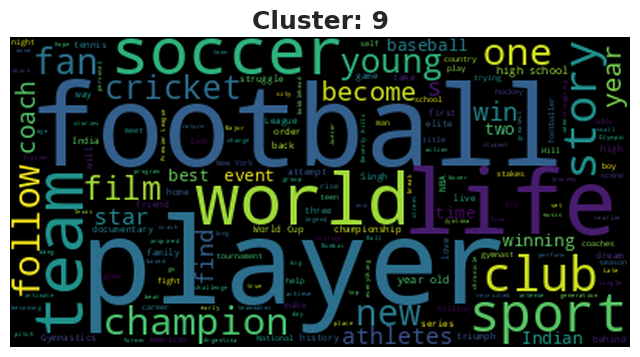

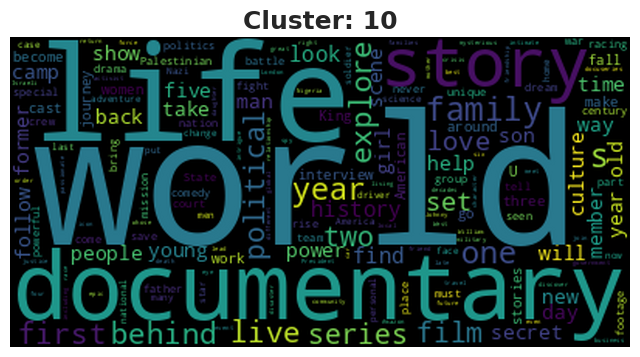

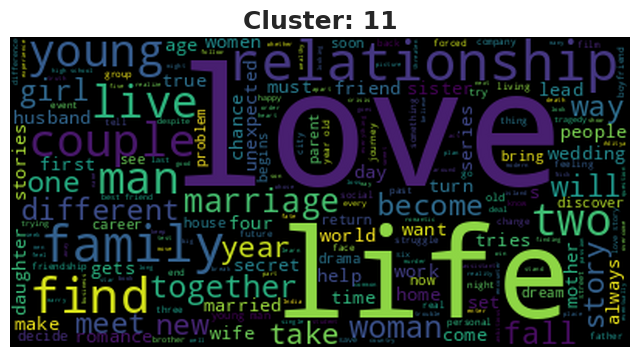

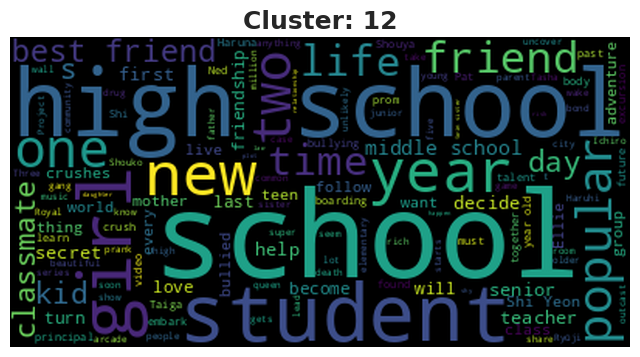

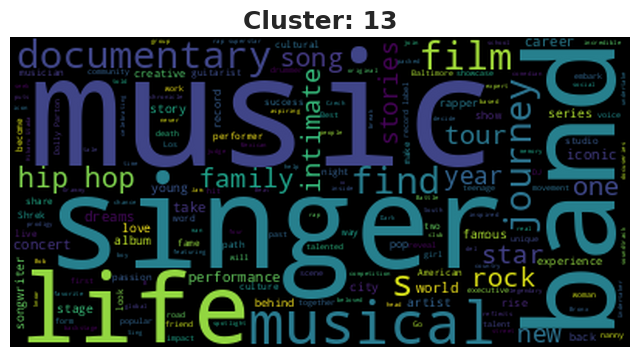

In [141]:
for i in range(14):
  func_select_Category_agg_clustering1(i,'description')

# **Dendogram**

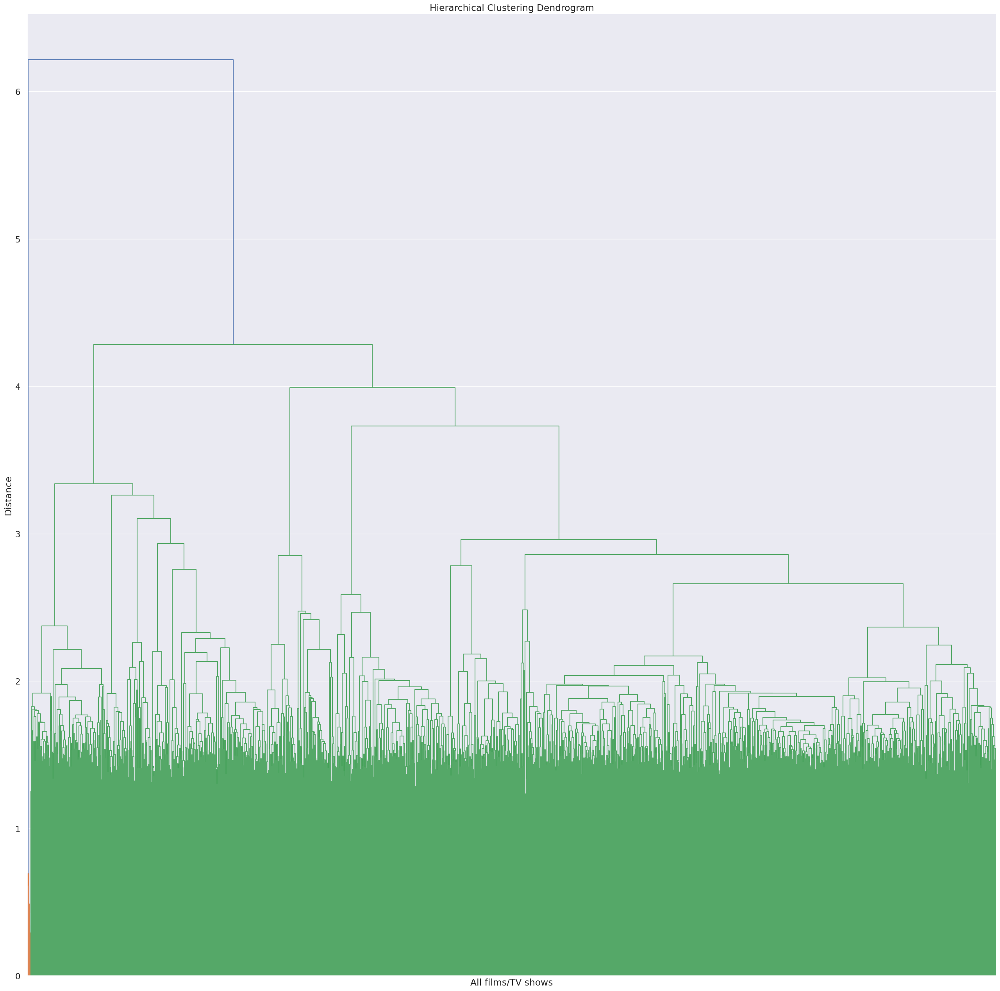

In [142]:
distances_linkage = linkage(X_transformed,
                            method = 'ward',
                            metric = 'euclidean')

plt.figure(figsize=(32, 32))

plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('All films/TV shows')
plt.ylabel('Distance')

dendrogram(
    distances_linkage,
    no_labels = True
)

plt.show()

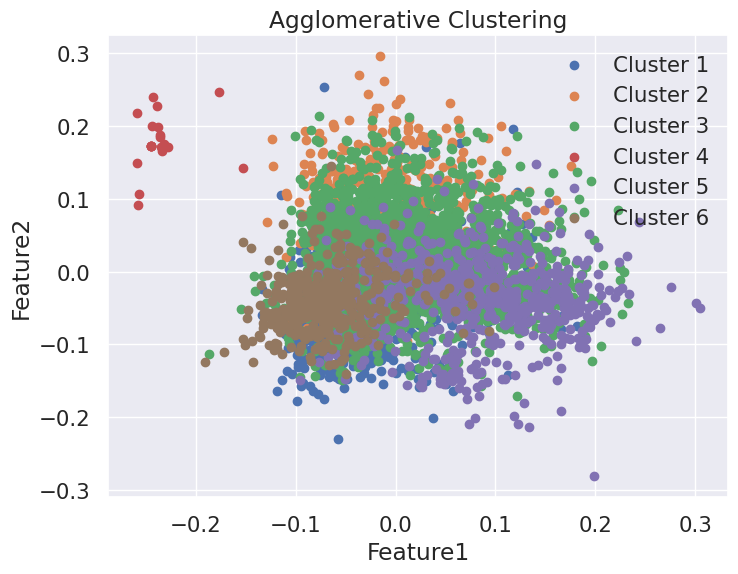

Cluster 1: 968 data points
Cluster 2: 419 data points
Cluster 3: 3322 data points
Cluster 4: 21 data points
Cluster 5: 667 data points
Cluster 6: 453 data points


In [143]:

n_clusters = 6
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
cluster_labels = agg_clustering.fit_predict(X_transformed)

data["Cluster"] = cluster_labels

plt.figure(figsize=(8, 6))
for cluster in range(n_clusters):
    plt.scatter(X_transformed[cluster_labels == cluster, 0],
                X_transformed[cluster_labels == cluster, 1],
                label=f"Cluster {cluster + 1}")
plt.xlabel("Feature1")
plt.ylabel("Feature2")
plt.title("Agglomerative Clustering")
plt.legend()
plt.show()

for cluster in range(n_clusters):
    print(f"Cluster {cluster + 1}: {sum(cluster_labels == cluster)} data points")

In [144]:
def func_select_Category_agg_clustering2(cluster_label,column_of_choice):
  df_word_cloud = data[['cluster_number_agg_clustering',column_of_choice]].dropna()
  df_word_cloud = df_word_cloud[df_word_cloud['cluster_number_agg_clustering']==cluster_label]
  text = " ".join(word for word in df_word_cloud[column_of_choice])
  stopwords = set(STOPWORDS)
  wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
  plt.imshow(wordcloud, interpolation='blackman')
  plt.title(f'Cluster: {i}', fontsize=18, fontweight='bold')
  plt.axis("off")
  plt.show()

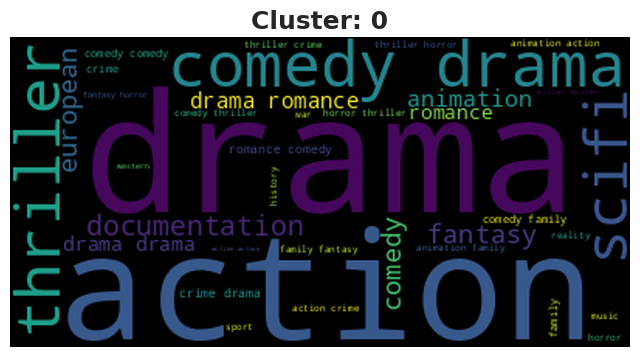

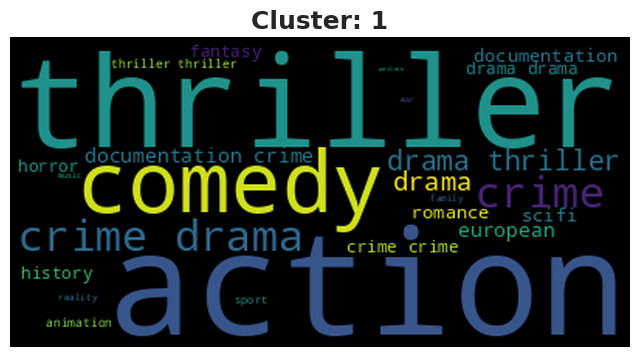

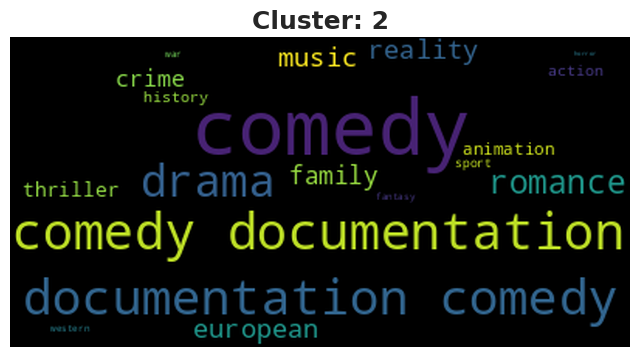

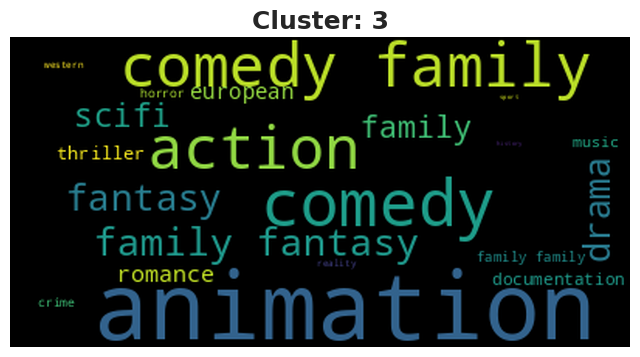

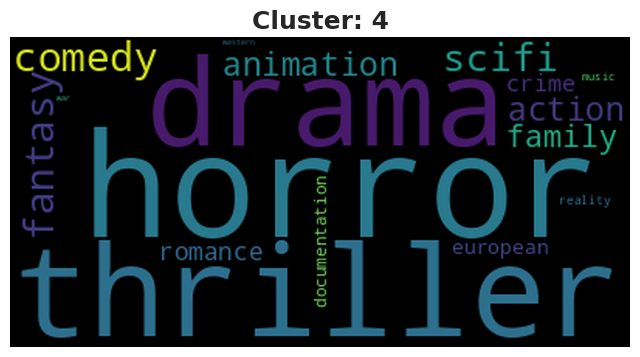

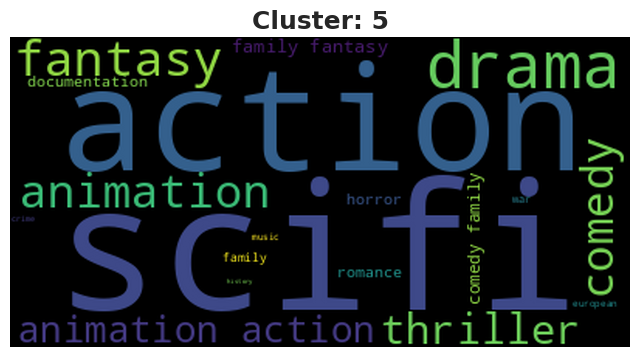

In [145]:
for i in range(6):
  func_select_Category_agg_clustering2(i,'genres')

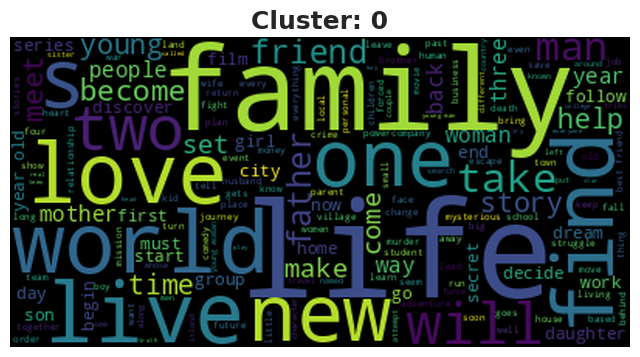

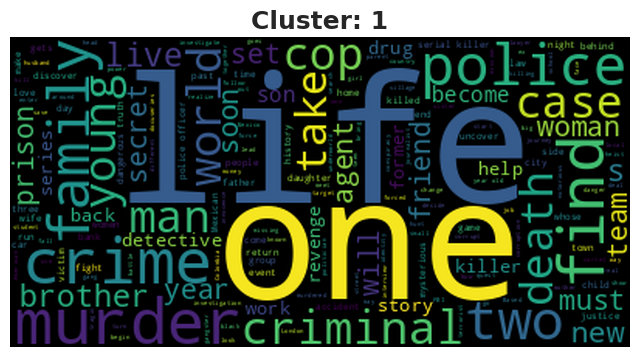

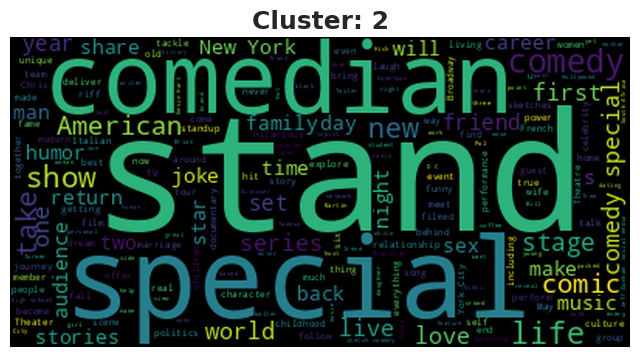

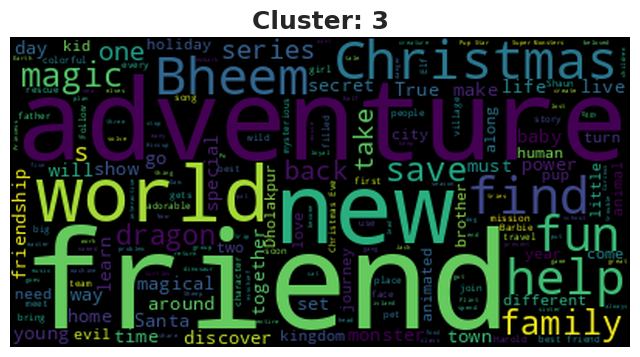

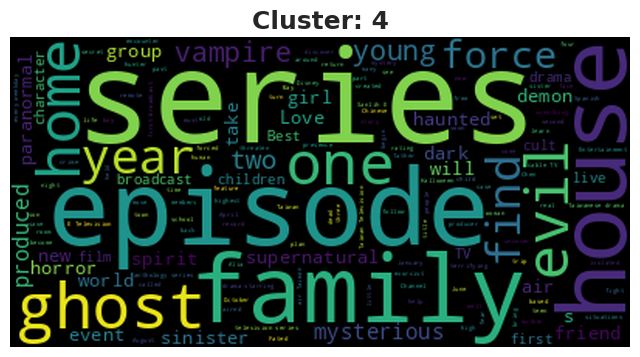

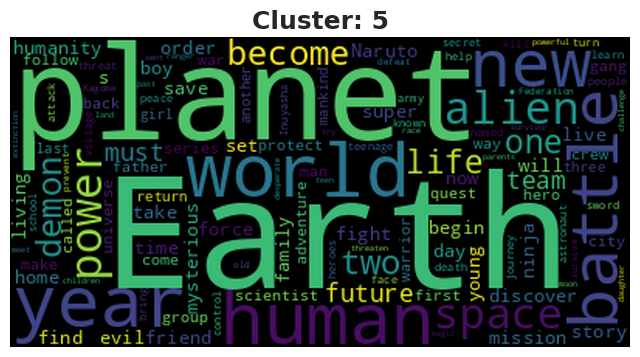

In [146]:
for i in range(6):
  func_select_Category_agg_clustering1(i,'description')

# **Suggestion Section**

In [147]:
tfidf = TfidfVectorizer(stop_words='english')
tfidf_matrix = tfidf.fit_transform(data['org_new'])
tfidf_matrix.shape

(5850, 16527)

# **Apply Cosine**

In [148]:
cosine_sim = cosine_similarity(tfidf_matrix)
programme_list=data['title'].to_list()

In [149]:
def recommend(title, cosine_similarity=cosine_sim):
    index = programme_list.index(title)
    sim_score = list(enumerate(cosine_sim[index]))

    sim_score = sorted(sim_score, key= lambda x: x[1], reverse=True)[1:11]
    recommend_index = [i[0] for i in sim_score]
    rec_movie = new_df['title'].iloc[recommend_index]
    rec_score = [round(i[1],4) for i in sim_score]
    rec_table = pd.DataFrame(list(zip(rec_movie,rec_score)), columns=['Recommended movie','Similarity(0-1)'])
    return rec_table

# **Input System**

In [150]:
print(programme_list)

['Five Came Back: The Reference Films', 'Taxi Driver', 'Deliverance', 'Monty Python and the Holy Grail', 'The Dirty Dozen', "Monty Python's Flying Circus", 'Life of Brian', 'Dirty Harry', 'Bonnie and Clyde', 'The Blue Lagoon', 'The Guns of Navarone', 'The Professionals', 'Richard Pryor: Live in Concert', 'White Christmas', 'Cairo Station', 'Hitler: A Career', 'FTA', 'Alexandria… Why?', 'The Land', 'Dostana', 'Saladin the Victorious', 'Alibaba Aur 40 Chor', 'The Blazing Sun', 'Dark Waters', 'We Are All for the Fatherland', 'Singapore', "Monty Python's Fliegender Zirkus", 'Beirut, Oh Beirut', 'The Return of the Prodigal Son', 'Khoon Khoon', 'Manoranjan', 'Ujala', 'Whispers', 'Chadi Jawani Budhe Nu', 'Bandie', 'Seinfeld', 'GoodFellas', 'Full Metal Jacket', 'Once Upon a Time in America', 'When Harry Met Sally...', 'A Nightmare on Elm Street', 'Steel Magnolias', 'Police Academy', 'Christine', 'Knight Rider', 'Thomas & Friends', 'Saved by the Bell', 'Awakenings', 'Wheel of Fortune', "Nationa

In [153]:
dropdown = widgets.Dropdown(
    options=programme_list,
    description='Choose a movie:',
    disabled=False,
)

def on_dropdown_change(change):
    selected_movie = change['new']

    recommendations = recommend(selected_movie)

    display(recommendations)

dropdown.observe(on_dropdown_change, names='value')

display(dropdown)


Dropdown(description='Choose a movie:', options=('Five Came Back: The Reference Films', 'Taxi Driver', 'Delive…

,Recommended movie,Similarity(0-1)
0,Cooked,0.1746
1,Sweetheart,0.1543
2,The Ultimate Braai Master,0.1468
3,A Drowning Man,0.1435
4,ReMastered: The Two Killings of Sam Cooke,0.1421
5,Bird Box,0.1369
6,Black,0.1244
7,Nailed It! Germany,0.1241
8,Aurora,0.1234
9,Our Planet,0.1217




 <a id='conclusion'></a>
 # **Conclusion**

1. The overall dataset has 5850 items and 15 columns.
2. The dataset is split into 36% TV Shows and 64% Movies.
3. The largest targeted rating is TV-MA and R making up 69.4% of total content.
4. The Growth of content accelerated starting in 2014 and peaking in 2020. With the most notable drop in 2021.
5. The Mean for release_year is 2016
6. With the oldest title release in 1945.
6. The United States is the highest producer of content at 2323 followed by India with 622, oddly while the US produces both Movies and Shows, India mainly produces movies with only 45 TV Shows.
7. The average IMDb score is 6.5
8. The average IMDb score for Movie is 6 and TV Show is higher at 7.
9. The average runtime for Movies is 98 min and TV Show is 39 minutes.
7. The top three category of content is Documentaries, Comedy and Dramas Movies.
7. The highest targeted audience group is Adults followed by Teens.
8. The US top produced category is Comedy, India's is Drama.
8. By applying varied clustering methods (Elbow, Silhouette, and Agglomerative) I determined that 14 clusters was the best fit.
9. By applying Wordcloud to the cluster models was able to determine the content of each cluster by model.

By use of this analysis I crafted a simple recommendation system that will incorporate the information derived from this study to identify movies / shows for the viewer to watch by utilizing a drop down menu to choose their show or movie.

In [1]:
pip install plotly


In [2]:
!pip install plotly

In [3]:
pip install ipywidgets


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 14.7 MB/s eta 0:00:00
